## INSURANCE CLAIM PROBABILITY BASED ON  POLICY FEATURES AND SAFETY RATINGS

In [1]:
# Importing basic Packages required for a project

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Importing given data as df

df = pd.read_csv('Insurance_data.csv')
df.head()

,policy_id,policy_tenure,age_of_car,age_of_policyholder,area_cluster,population_density,make,segment,model,fuel_type,...,is_brake_assist,is_power_door_locks,is_central_locking,is_power_steering,is_driver_seat_height_adjustable,is_day_night_rear_view_mirror,is_ecw,is_speed_alert,ncap_rating,is_claim
0,ID00001,0.515874,0.05,0.644231,C1,4990,1,A,M1,CNG,...,No,No,No,Yes,No,No,No,Yes,0,0
1,ID00002,0.672619,0.02,0.375000,C2,27003,1,A,M1,CNG,...,No,No,No,Yes,No,No,No,Yes,0,0
2,ID00003,0.841110,0.02,0.384615,C3,4076,1,A,M1,CNG,...,No,No,No,Yes,No,No,No,Yes,0,0
3,ID00004,0.900277,0.11,0.432692,C4,21622,1,C1,M2,Petrol,...,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,2,0
4,ID00005,0.596403,0.11,0.634615,C5,34738,2,A,M3,Petrol,...,No,Yes,Yes,Yes,No,Yes,Yes,Yes,2,0


In [3]:
# checking and imputing null values in a features

df.isnull().sum()

policy_id                           0
policy_tenure                       0
age_of_car                          0
age_of_policyholder                 0
area_cluster                        0
population_density                  0
make                                0
segment                             0
model                               0
fuel_type                           0
max_torque                          0
max_power                           0
engine_type                         0
airbags                             0
is_esc                              0
is_adjustable_steering              0
is_tpms                             0
is_parking_sensors                  0
is_parking_camera                   0
rear_brakes_type                    0
displacement                        0
cylinder                            0
transmission_type                   0
gear_box                            0
steering_type                       0
turning_radius                      0
length      

In [4]:
# Checking duplicates and removing duplicated

df.duplicated().sum()

0

In [5]:
# To check the column names in a dataset

df.columns

Index(['policy_id', 'policy_tenure', 'age_of_car', 'age_of_policyholder',
       'area_cluster', 'population_density', 'make', 'segment', 'model',
       'fuel_type', 'max_torque', 'max_power', 'engine_type', 'airbags',
       'is_esc', 'is_adjustable_steering', 'is_tpms', 'is_parking_sensors',
       'is_parking_camera', 'rear_brakes_type', 'displacement', 'cylinder',
       'transmission_type', 'gear_box', 'steering_type', 'turning_radius',
       'length', 'width', 'height', 'gross_weight', 'is_front_fog_lights',
       'is_rear_window_wiper', 'is_rear_window_washer',
       'is_rear_window_defogger', 'is_brake_assist', 'is_power_door_locks',
       'is_central_locking', 'is_power_steering',
       'is_driver_seat_height_adjustable', 'is_day_night_rear_view_mirror',
       'is_ecw', 'is_speed_alert', 'ncap_rating', 'is_claim'],
      dtype='object')

In [6]:
# To check the sahpe of a data

df.shape

(58592, 44)

In [7]:
# To check the each feature,its typw and total values in the dataset

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58592 entries, 0 to 58591
Data columns (total 44 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   policy_id                         58592 non-null  object 
 1   policy_tenure                     58592 non-null  float64
 2   age_of_car                        58592 non-null  float64
 3   age_of_policyholder               58592 non-null  float64
 4   area_cluster                      58592 non-null  object 
 5   population_density                58592 non-null  int64  
 6   make                              58592 non-null  int64  
 7   segment                           58592 non-null  object 
 8   model                             58592 non-null  object 
 9   fuel_type                         58592 non-null  object 
 10  max_torque                        58592 non-null  object 
 11  max_power                         58592 non-null  object 
 12  engi

In [8]:
df['max_torque']

0         60Nm@3500rpm
1         60Nm@3500rpm
2         60Nm@3500rpm
3        113Nm@4400rpm
4         91Nm@4250rpm
             ...      
58587     91Nm@4250rpm
58588     60Nm@3500rpm
58589     60Nm@3500rpm
58590    113Nm@4400rpm
58591    250Nm@2750rpm
Name: max_torque, Length: 58592, dtype: object

In [9]:
# Torque columns is mixed one so it is splitted in two subfeatures i.e Torque_Nm and TorqueSpeed_in_RPM

Torque_in_Nm = []

for i in df['max_torque']:
    value = i.split('@')[0]
    Torque = value.split('Nm')[0]
    Torque_in_Nm.append(Torque)
    
df['Torque_Nm'] = Torque_in_Nm

In [10]:
TorqueSpeed_1 = []

for i in df['max_torque']:
    value_1 = i.split('@')[1]
    TorqueSpeed = value_1.split('rpm')[0]
    TorqueSpeed_1.append(TorqueSpeed)
    
df['TorqueSpeed_in_RPM'] = TorqueSpeed_1

In [11]:
# Power columns is mixed one so it is splitted in two subfeatures i.e Power_in_bhp and Power_Speed_RPM

power = []

for i in df['max_power']:
    power_1 = i.split('@')[0]
    power_2 = power_1.split('bhp')[0]
    power.append(power_2)
    
df['Power_in_bhp'] = power

In [12]:
power_s = []

for i in df['max_power']:
    power_speed_1 = i.split('@')[1]
    power_speed_2 = power_speed_1.split('rpm')[0]
    power_s.append(power_speed_2)
    
df['Power_Speed_RPM'] = power_s

In [13]:
# After splitting the data Torque_Nm and max_power features remove from the dataset to get the updated data

df.drop(columns = ['max_torque', 'max_power'], inplace=True)
df.head()

,policy_id,policy_tenure,age_of_car,age_of_policyholder,area_cluster,population_density,make,segment,model,fuel_type,...,is_driver_seat_height_adjustable,is_day_night_rear_view_mirror,is_ecw,is_speed_alert,ncap_rating,is_claim,Torque_Nm,TorqueSpeed_in_RPM,Power_in_bhp,Power_Speed_RPM
0,ID00001,0.515874,0.05,0.644231,C1,4990,1,A,M1,CNG,...,No,No,No,Yes,0,0,60,3500,40.36,6000
1,ID00002,0.672619,0.02,0.375000,C2,27003,1,A,M1,CNG,...,No,No,No,Yes,0,0,60,3500,40.36,6000
2,ID00003,0.841110,0.02,0.384615,C3,4076,1,A,M1,CNG,...,No,No,No,Yes,0,0,60,3500,40.36,6000
3,ID00004,0.900277,0.11,0.432692,C4,21622,1,C1,M2,Petrol,...,Yes,Yes,Yes,Yes,2,0,113,4400,88.50,6000
4,ID00005,0.596403,0.11,0.634615,C5,34738,2,A,M3,Petrol,...,No,Yes,Yes,Yes,2,0,91,4250,67.06,5500


In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58592 entries, 0 to 58591
Data columns (total 46 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   policy_id                         58592 non-null  object 
 1   policy_tenure                     58592 non-null  float64
 2   age_of_car                        58592 non-null  float64
 3   age_of_policyholder               58592 non-null  float64
 4   area_cluster                      58592 non-null  object 
 5   population_density                58592 non-null  int64  
 6   make                              58592 non-null  int64  
 7   segment                           58592 non-null  object 
 8   model                             58592 non-null  object 
 9   fuel_type                         58592 non-null  object 
 10  engine_type                       58592 non-null  object 
 11  airbags                           58592 non-null  int64  
 12  is_e

In [15]:
# converting Torque_Nm, TorqueSpeed_in_RPM, Power_in_bhp and Power_Speed_RPM in Int since it is showing object

df['Torque_Nm'] = df['Torque_Nm'].astype(float)  # Converts to float
df['TorqueSpeed_in_RPM'] = df['TorqueSpeed_in_RPM'].astype(float)  # Converts to float
df['Power_in_bhp'] = df['Power_in_bhp'].astype(float)  # Converts to float
df['Power_Speed_RPM'] = df['Power_Speed_RPM'].astype(float)  # Converts to float


In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58592 entries, 0 to 58591
Data columns (total 46 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   policy_id                         58592 non-null  object 
 1   policy_tenure                     58592 non-null  float64
 2   age_of_car                        58592 non-null  float64
 3   age_of_policyholder               58592 non-null  float64
 4   area_cluster                      58592 non-null  object 
 5   population_density                58592 non-null  int64  
 6   make                              58592 non-null  int64  
 7   segment                           58592 non-null  object 
 8   model                             58592 non-null  object 
 9   fuel_type                         58592 non-null  object 
 10  engine_type                       58592 non-null  object 
 11  airbags                           58592 non-null  int64  
 12  is_e

In [17]:
df.columns

Index(['policy_id', 'policy_tenure', 'age_of_car', 'age_of_policyholder',
       'area_cluster', 'population_density', 'make', 'segment', 'model',
       'fuel_type', 'engine_type', 'airbags', 'is_esc',
       'is_adjustable_steering', 'is_tpms', 'is_parking_sensors',
       'is_parking_camera', 'rear_brakes_type', 'displacement', 'cylinder',
       'transmission_type', 'gear_box', 'steering_type', 'turning_radius',
       'length', 'width', 'height', 'gross_weight', 'is_front_fog_lights',
       'is_rear_window_wiper', 'is_rear_window_washer',
       'is_rear_window_defogger', 'is_brake_assist', 'is_power_door_locks',
       'is_central_locking', 'is_power_steering',
       'is_driver_seat_height_adjustable', 'is_day_night_rear_view_mirror',
       'is_ecw', 'is_speed_alert', 'ncap_rating', 'is_claim', 'Torque_Nm',
       'TorqueSpeed_in_RPM', 'Power_in_bhp', 'Power_Speed_RPM'],
      dtype='object')

In [18]:
# Creating a function for columns data type and separate then accordignly so that if the any other data with other feature are come then we can use this dynamically

def Splitting_Columns(df):
    num_continues = []
    num_discrete = []
    obj_Highcategory = []
    obj_Lowcategory = []
    
    for column in df.columns:
        if df[column].dtype == 'object':
            if df[column].nunique() < 15:
                obj_Lowcategory.append(column)
            else:
                obj_Highcategory.append(column)
        elif df[column].dtype in ['int64','float64']:
            if df[column].nunique()<10:
                num_discrete.append(column)
            else:
                num_continues.append(column)
    return num_continues, num_discrete, obj_Highcategory, obj_Lowcategory
    

In [19]:
# Assigning variable to each return value

continues_num, discrete_num, Highcategory_obj, Lowcategory_obj = Splitting_Columns(df)

In [20]:
# Checking the values in a features for dataset

print("Continues numbers are: ",continues_num)
print(end='\n')
print("discrete numbers are: ",discrete_num)
print(end='\n')
print("High Category columns are",Highcategory_obj)
print(end='\n')
print("Low Category columns are", Lowcategory_obj)

Continues numbers are:  ['policy_tenure', 'age_of_car', 'age_of_policyholder', 'population_density', 'width', 'height', 'gross_weight']

discrete numbers are:  ['make', 'airbags', 'displacement', 'cylinder', 'gear_box', 'turning_radius', 'length', 'ncap_rating', 'is_claim', 'Torque_Nm', 'TorqueSpeed_in_RPM', 'Power_in_bhp', 'Power_Speed_RPM']

High Category columns are ['policy_id', 'area_cluster']

Low Category columns are ['segment', 'model', 'fuel_type', 'engine_type', 'is_esc', 'is_adjustable_steering', 'is_tpms', 'is_parking_sensors', 'is_parking_camera', 'rear_brakes_type', 'transmission_type', 'steering_type', 'is_front_fog_lights', 'is_rear_window_wiper', 'is_rear_window_washer', 'is_rear_window_defogger', 'is_brake_assist', 'is_power_door_locks', 'is_central_locking', 'is_power_steering', 'is_driver_seat_height_adjustable', 'is_day_night_rear_view_mirror', 'is_ecw', 'is_speed_alert']


In [21]:
# To check the the values in each low categorical columns

for i in Lowcategory_obj:
    print(i)
    print(df[i].unique())
    print()
    

segment
['A' 'C1' 'C2' 'B2' 'B1' 'Utility']

model
['M1' 'M2' 'M3' 'M4' 'M5' 'M6' 'M7' 'M8' 'M9' 'M10' 'M11']

fuel_type
['CNG' 'Petrol' 'Diesel']

engine_type
['F8D Petrol Engine' '1.2 L K12N Dualjet' '1.0 SCe' '1.5 L U2 CRDi'
 '1.5 Turbocharged Revotorq' 'K Series Dual jet' '1.2 L K Series Engine'
 'K10C' 'i-DTEC' 'G12B' '1.5 Turbocharged Revotron']

is_esc
['No' 'Yes']

is_adjustable_steering
['No' 'Yes']

is_tpms
['No' 'Yes']

is_parking_sensors
['Yes' 'No']

is_parking_camera
['No' 'Yes']

rear_brakes_type
['Drum' 'Disc']

transmission_type
['Manual' 'Automatic']

steering_type
['Power' 'Electric' 'Manual']

is_front_fog_lights
['No' 'Yes']

is_rear_window_wiper
['No' 'Yes']

is_rear_window_washer
['No' 'Yes']

is_rear_window_defogger
['No' 'Yes']

is_brake_assist
['No' 'Yes']

is_power_door_locks
['No' 'Yes']

is_central_locking
['No' 'Yes']

is_power_steering
['Yes' 'No']

is_driver_seat_height_adjustable
['No' 'Yes']

is_day_night_rear_view_mirror
['No' 'Yes']

is_ecw
['No' 'Ye

In [22]:
# To check the the number of values in each low categorical columns

for i in Lowcategory_obj:
    # print(i)
    print(df[i].value_counts())
    print()
    

segment
B2         18314
A          17321
C2         14018
B1          4173
C1          3557
Utility     1209
Name: count, dtype: int64

model
M1     14948
M4     14018
M6     13776
M8      4173
M7      2940
M3      2373
M9      2114
M5      1598
M10     1209
M2      1080
M11      363
Name: count, dtype: int64

fuel_type
Petrol    20532
CNG       20330
Diesel    17730
Name: count, dtype: int64

engine_type
F8D Petrol Engine            14948
1.5 L U2 CRDi                14018
K Series Dual jet            13776
K10C                          4173
1.2 L K Series Engine         2940
1.0 SCe                       2373
i-DTEC                        2114
1.5 Turbocharged Revotorq     1598
G12B                          1209
1.2 L K12N Dualjet            1080
1.5 Turbocharged Revotron      363
Name: count, dtype: int64

is_esc
No     40191
Yes    18401
Name: count, dtype: int64

is_adjustable_steering
Yes    35526
No     23066
Name: count, dtype: int64

is_tpms
No     44574
Yes    14018
Name: co

In [23]:
# To check the the number of values in each low categorical columns

for i in discrete_num:
    # print(i)
    print(df[i].value_counts())
    print()


make
1    38126
3    14018
2     2373
5     2114
4     1961
Name: count, dtype: int64

airbags
2    40425
6    16958
1     1209
Name: count, dtype: int64

displacement
1197    17796
796     14948
1493    14018
998      4173
999      2373
1498     2114
1497     1598
1196     1209
1199      363
Name: count, dtype: int64

cylinder
4    36735
3    21857
Name: count, dtype: int64

gear_box
5    44211
6    14381
Name: count, dtype: int64

turning_radius
4.60    14948
4.80    14856
5.20    14018
4.70     4173
5.00     3971
4.85     2940
4.90     2114
4.50     1209
5.10      363
Name: count, dtype: int64

length
3445    14948
4300    14018
3845    13776
3990     4538
3655     4173
3995     3194
3731     2373
3675     1209
3993      363
Name: count, dtype: int64

ncap_rating
2    21402
0    19097
3    14018
4     2114
5     1961
Name: count, dtype: int64

is_claim
0    54844
1     3748
Name: count, dtype: int64

Torque_Nm
113.0    17796
60.0     14948
250.0    14018
82.1      4173
200.0     371

In [24]:
print(continues_num)

['policy_tenure', 'age_of_car', 'age_of_policyholder', 'population_density', 'width', 'height', 'gross_weight']


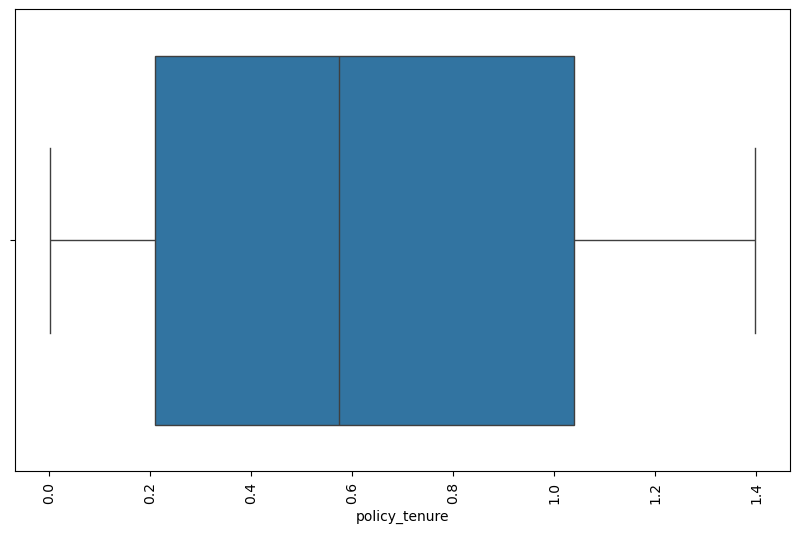

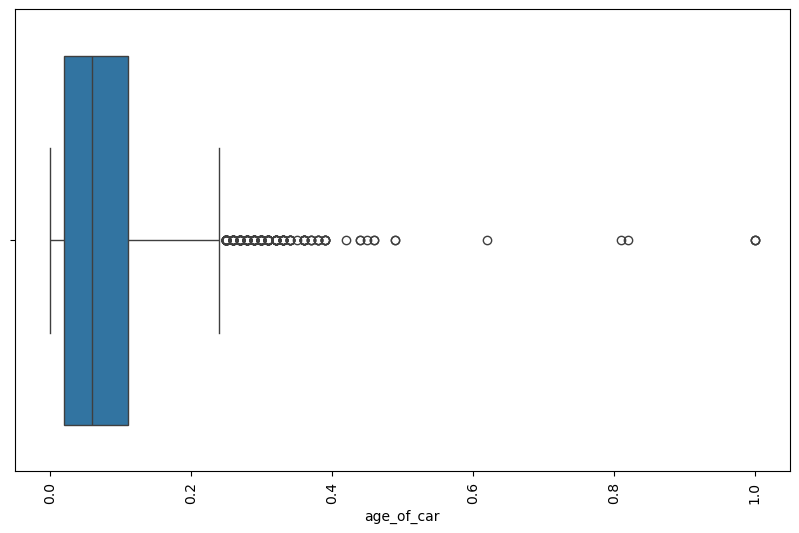

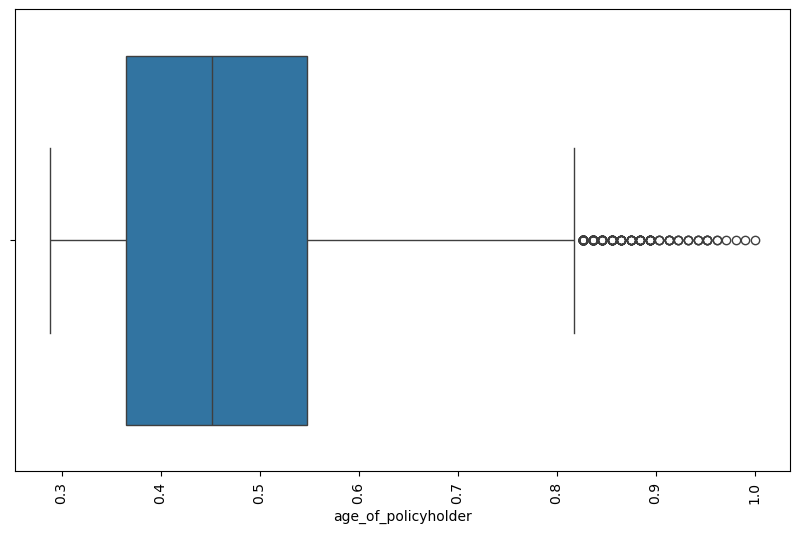

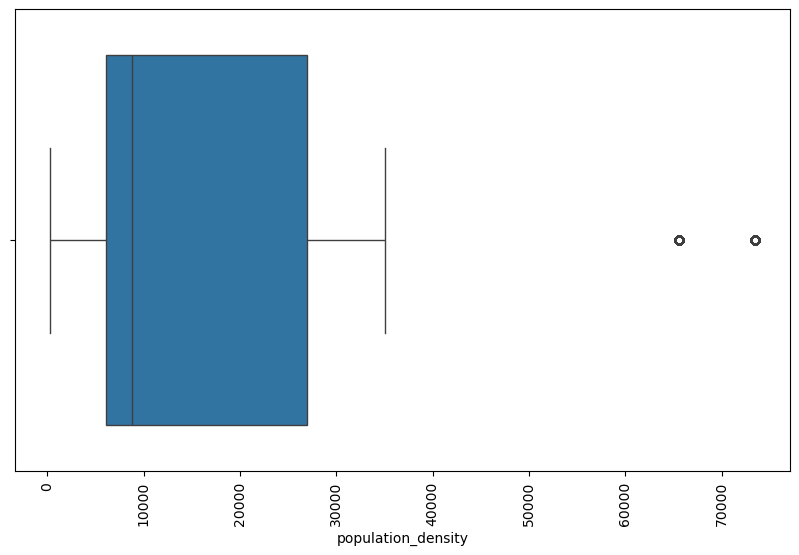

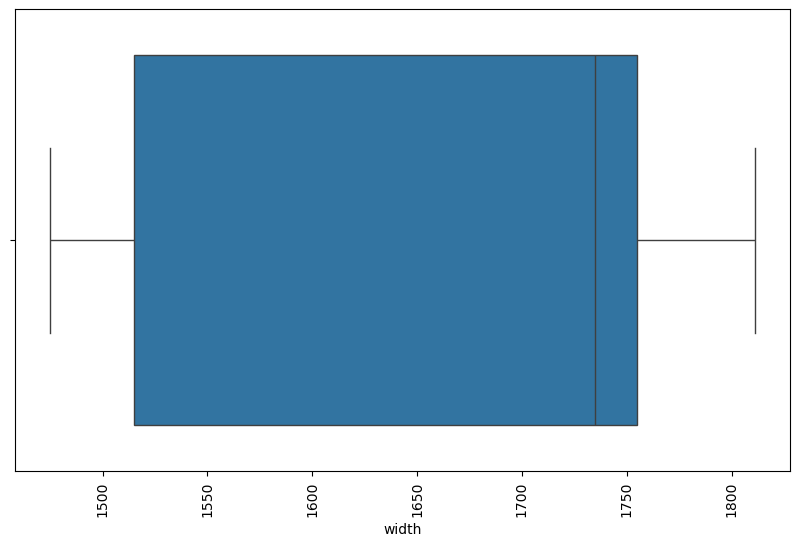

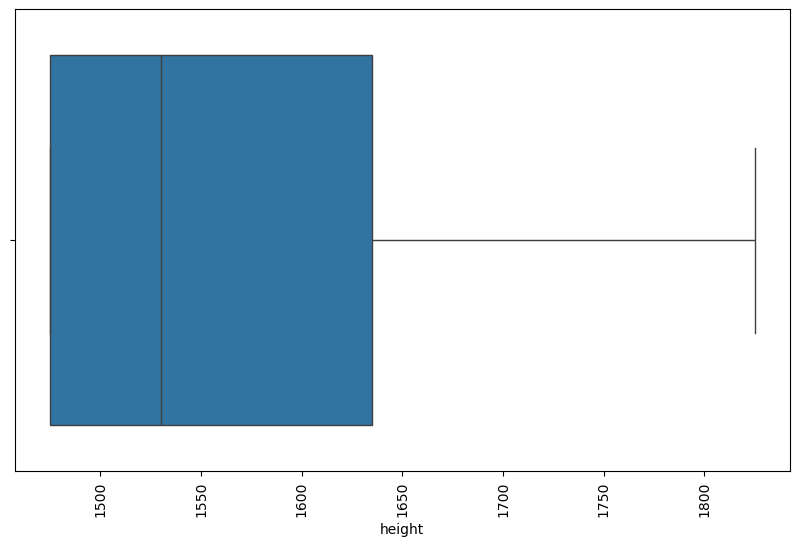

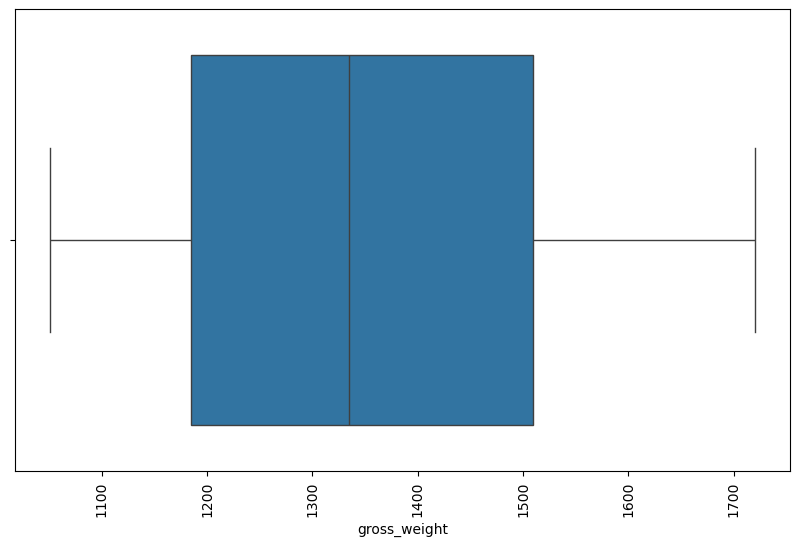

In [25]:
# To Check the ouliers in numerical continues variable using boxplot

for i in continues_num:
    plt.figure(figsize=(10,6))
    sns.boxplot(x=i,data=df)
    plt.xticks(rotation=90)
    plt.show()

In [26]:
# Outliers treatment using IQR (Capping with lowest and highest value)

out = []
for i in continues_num:
    out.append(i)
    
    # Calculate IQR
    Q1 = df[i].quantile(0.25)
    Q3 = df[i].quantile(0.75)
    IQR = Q3 - Q1
    
    # Define outlier bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Detect outliers
    outliers = df[(df[i] < lower_bound) | (df[i] > upper_bound)]
    
    #print(outliers)
    df[i] = df[i].apply(lambda x: lower_bound if x < lower_bound else upper_bound if x > upper_bound else x)
    

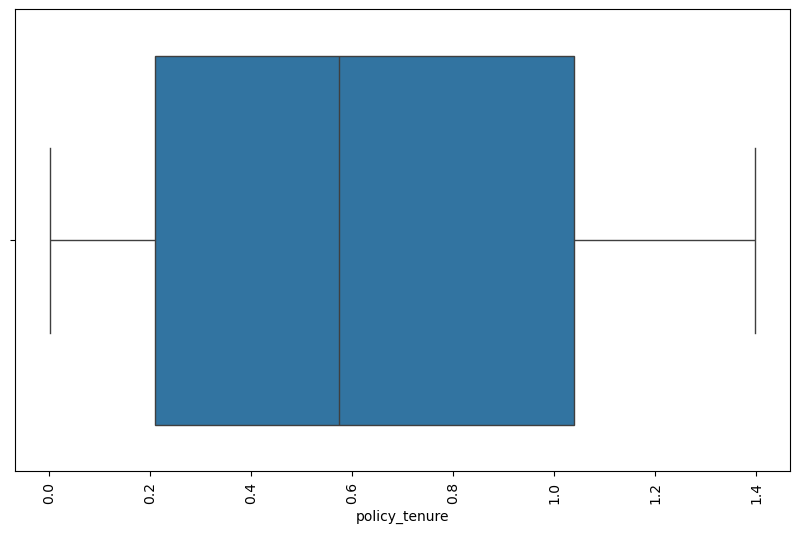

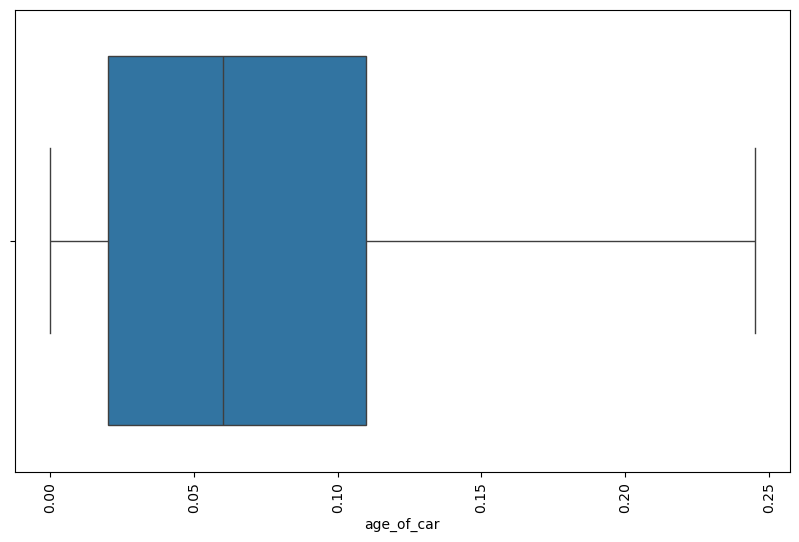

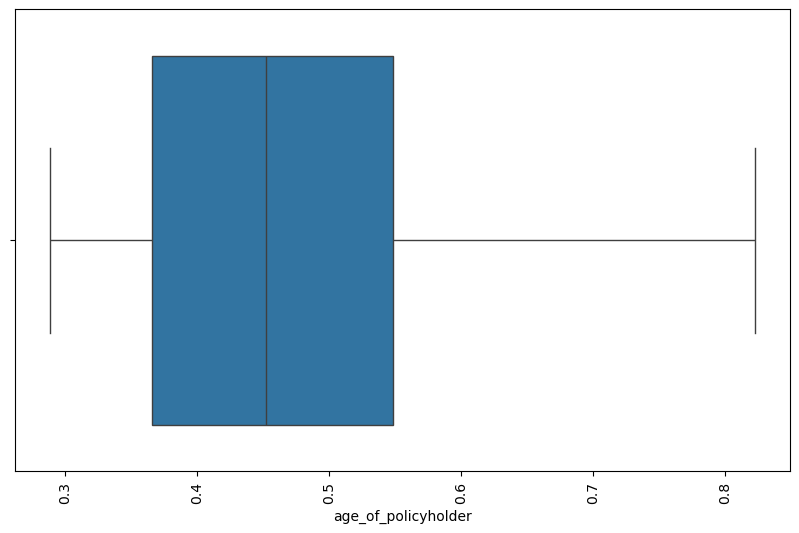

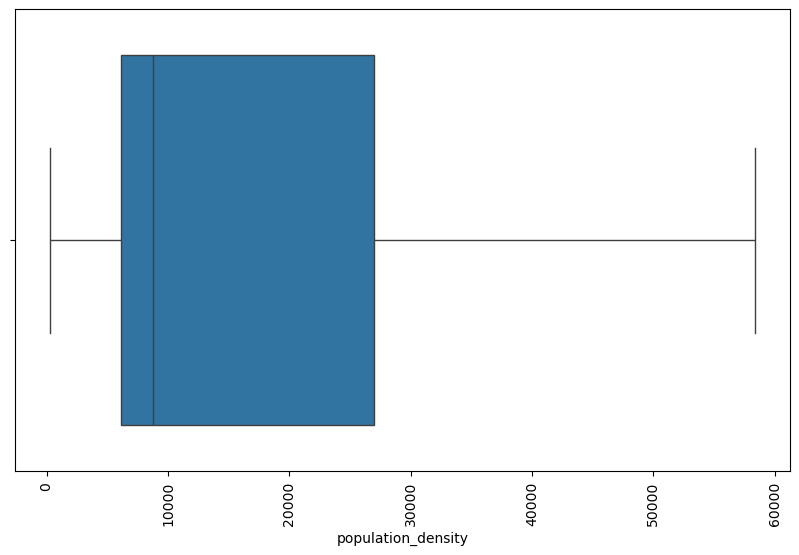

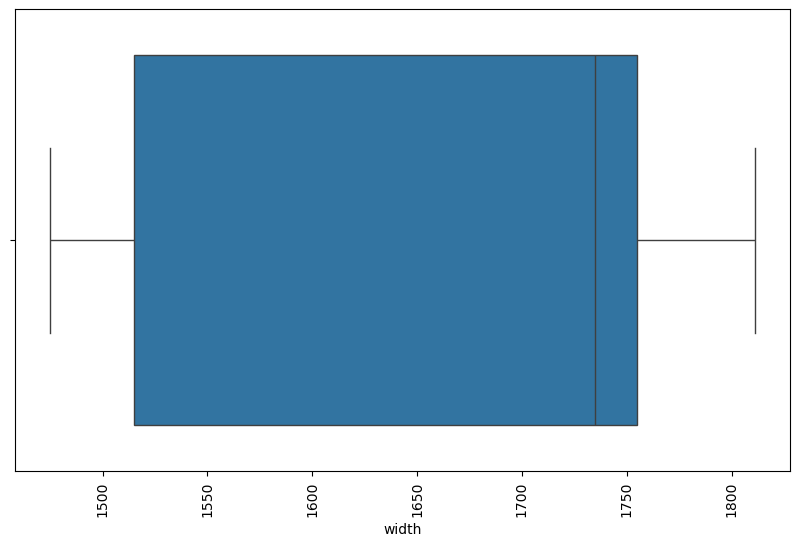

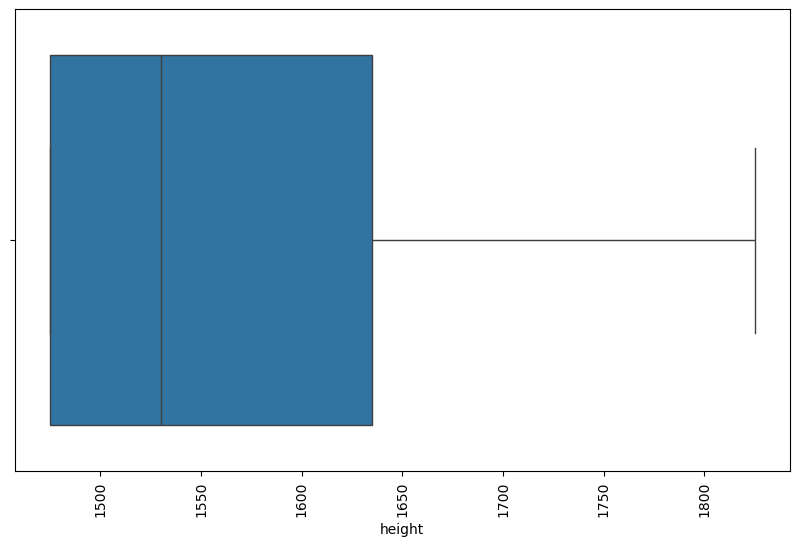

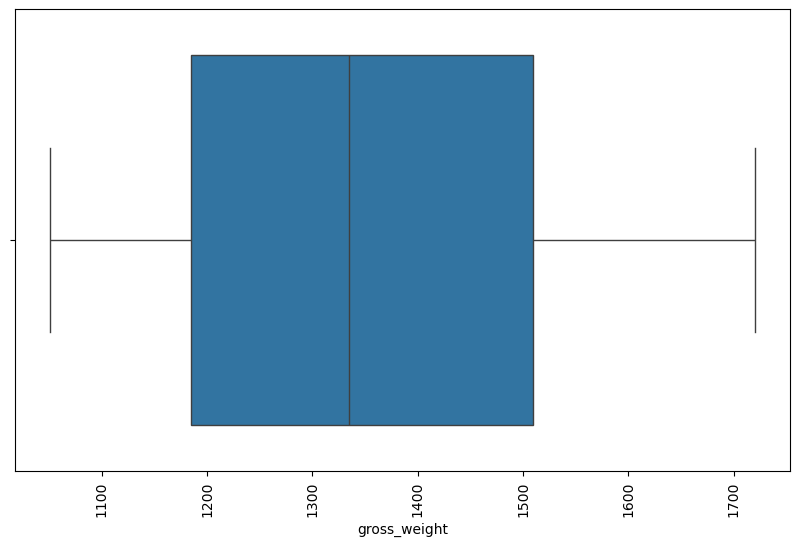

In [27]:
# Checking the boxplot again to check the outlier is handled correctly

for i in continues_num:
    plt.figure(figsize=(10,6))
    sns.boxplot(x=i,data=df)
    plt.xticks(rotation=90)
    plt.show()

In [28]:
# Checking the values in a features for dataset

print("Continues numbers are: ",continues_num)
print(end='\n')
print("discrete numbers are: ",discrete_num)
print(end='\n')
print("High Category columns are",Highcategory_obj)
print(end='\n')
print("Low Category columns are", Lowcategory_obj)

Continues numbers are:  ['policy_tenure', 'age_of_car', 'age_of_policyholder', 'population_density', 'width', 'height', 'gross_weight']

discrete numbers are:  ['make', 'airbags', 'displacement', 'cylinder', 'gear_box', 'turning_radius', 'length', 'ncap_rating', 'is_claim', 'Torque_Nm', 'TorqueSpeed_in_RPM', 'Power_in_bhp', 'Power_Speed_RPM']

High Category columns are ['policy_id', 'area_cluster']

Low Category columns are ['segment', 'model', 'fuel_type', 'engine_type', 'is_esc', 'is_adjustable_steering', 'is_tpms', 'is_parking_sensors', 'is_parking_camera', 'rear_brakes_type', 'transmission_type', 'steering_type', 'is_front_fog_lights', 'is_rear_window_wiper', 'is_rear_window_washer', 'is_rear_window_defogger', 'is_brake_assist', 'is_power_door_locks', 'is_central_locking', 'is_power_steering', 'is_driver_seat_height_adjustable', 'is_day_night_rear_view_mirror', 'is_ecw', 'is_speed_alert']


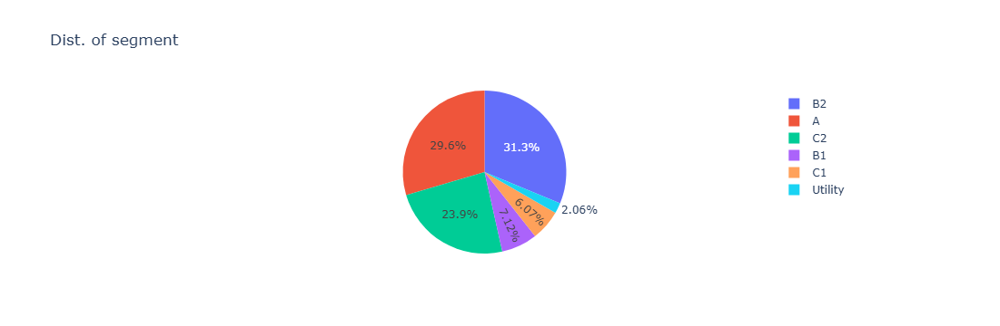

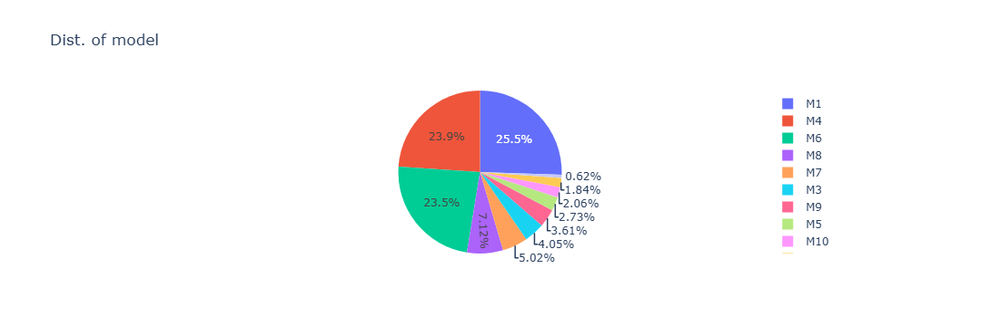

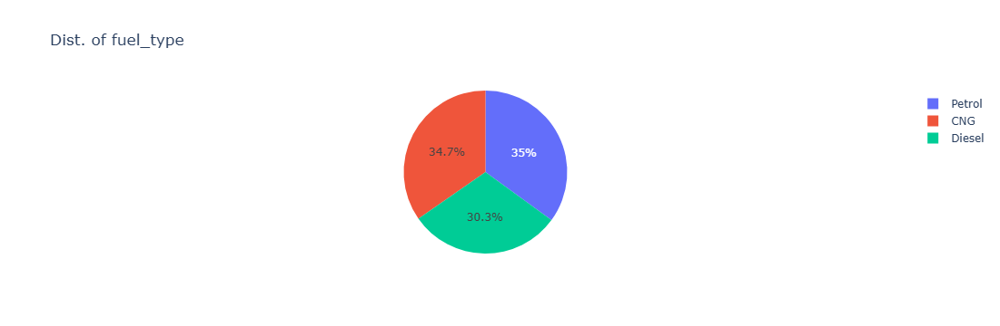

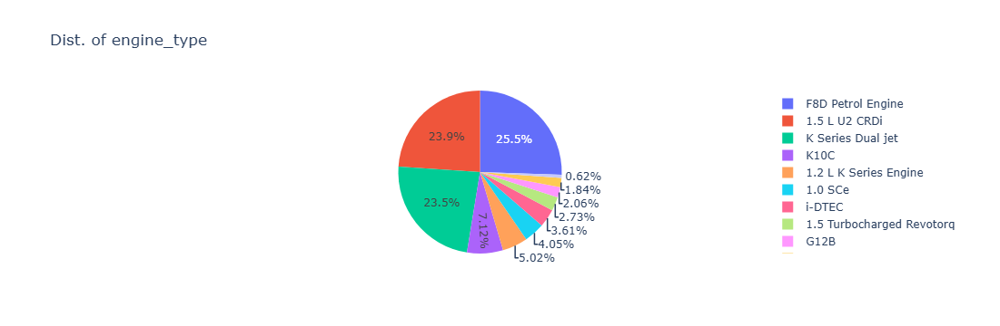

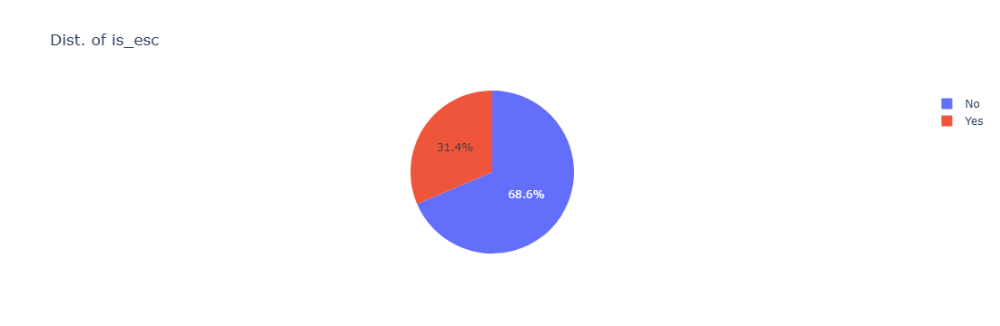

...

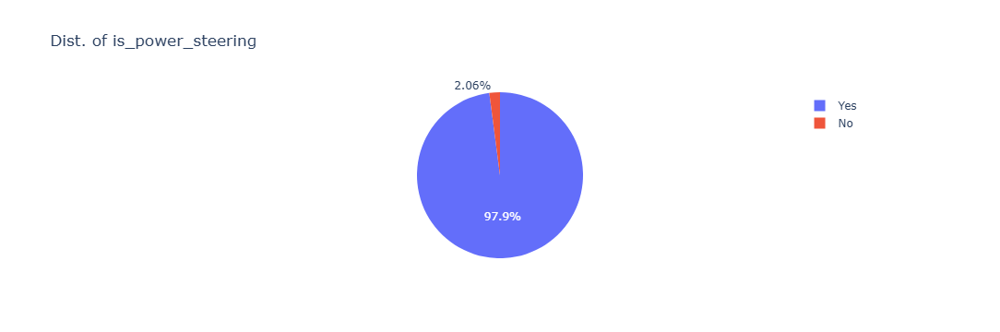

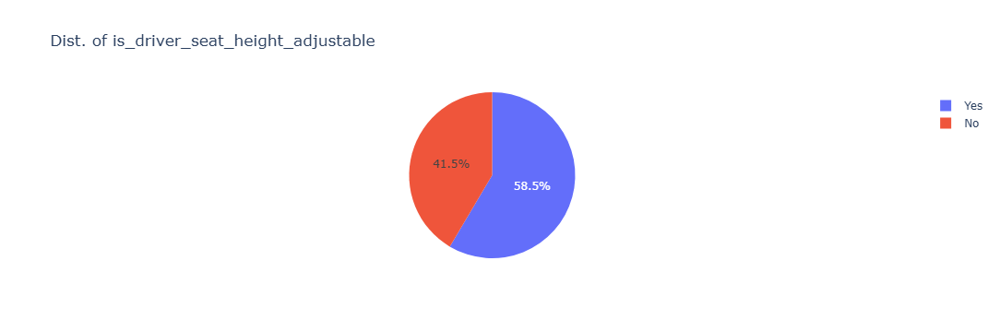

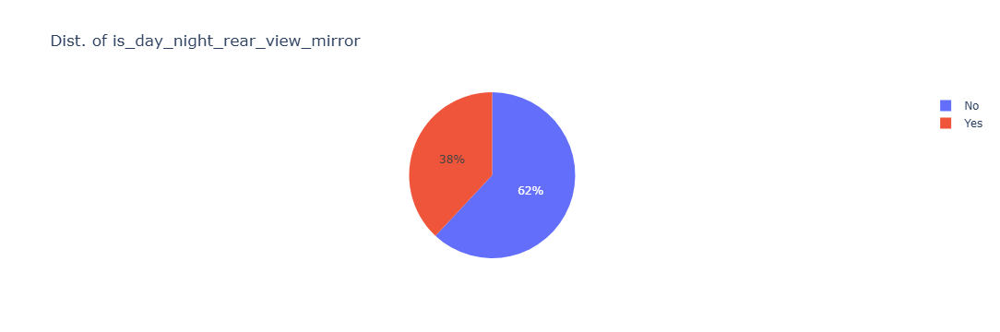

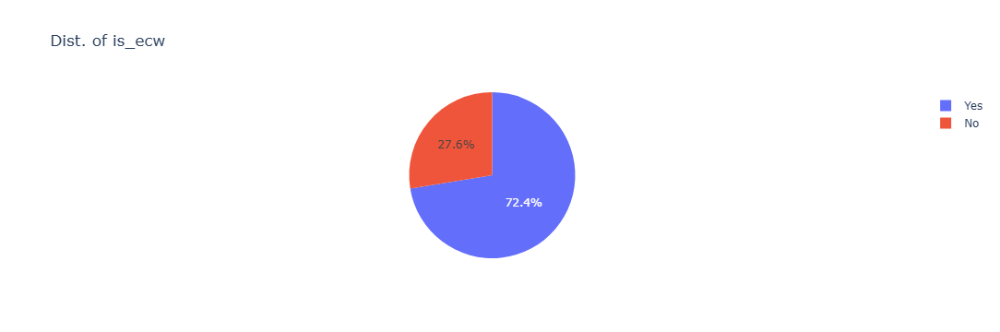

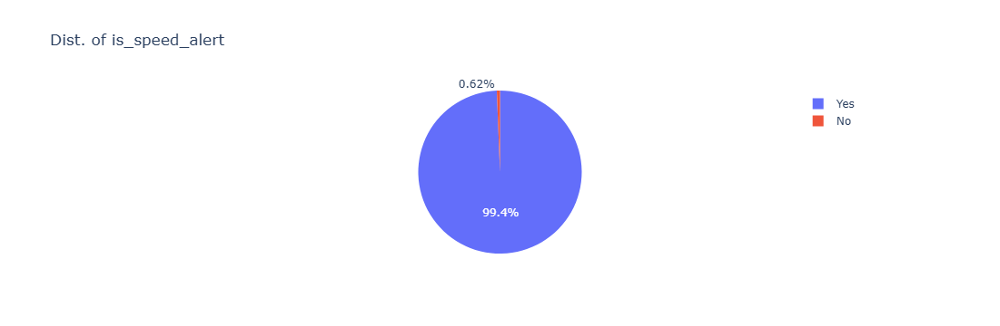

In [29]:
# To check the columns in Lowcategory_obj and get the data in a form of pie to visualise the number 

import plotly.express as px
for i in Lowcategory_obj:
    counts = df[i].value_counts()
    fig = px.pie(counts, values = counts.values, names=counts.index, title=f'Dist. of {i}')
    fig.show()

### From the above plots we can see that for the features is_speed_alert, is_power_steering and is_parking_sensors distribution of Yes and no values Yes values is more than 95 percentage so we  can drop this further.

In [30]:
# To split the variables in categrical and numerical to check the feature importnace with numeriacl and categorical with the target variable

num_feature=[]
cat_feature=[]
for i in df.columns:
    if df[i].dtype=='object':
        cat_feature.append(i)  
    else:
        num_feature.append(i)

print(cat_feature)
print()
print(num_feature)

['policy_id', 'area_cluster', 'segment', 'model', 'fuel_type', 'engine_type', 'is_esc', 'is_adjustable_steering', 'is_tpms', 'is_parking_sensors', 'is_parking_camera', 'rear_brakes_type', 'transmission_type', 'steering_type', 'is_front_fog_lights', 'is_rear_window_wiper', 'is_rear_window_washer', 'is_rear_window_defogger', 'is_brake_assist', 'is_power_door_locks', 'is_central_locking', 'is_power_steering', 'is_driver_seat_height_adjustable', 'is_day_night_rear_view_mirror', 'is_ecw', 'is_speed_alert']

['policy_tenure', 'age_of_car', 'age_of_policyholder', 'population_density', 'make', 'airbags', 'displacement', 'cylinder', 'gear_box', 'turning_radius', 'length', 'width', 'height', 'gross_weight', 'ncap_rating', 'is_claim', 'Torque_Nm', 'TorqueSpeed_in_RPM', 'Power_in_bhp', 'Power_Speed_RPM']


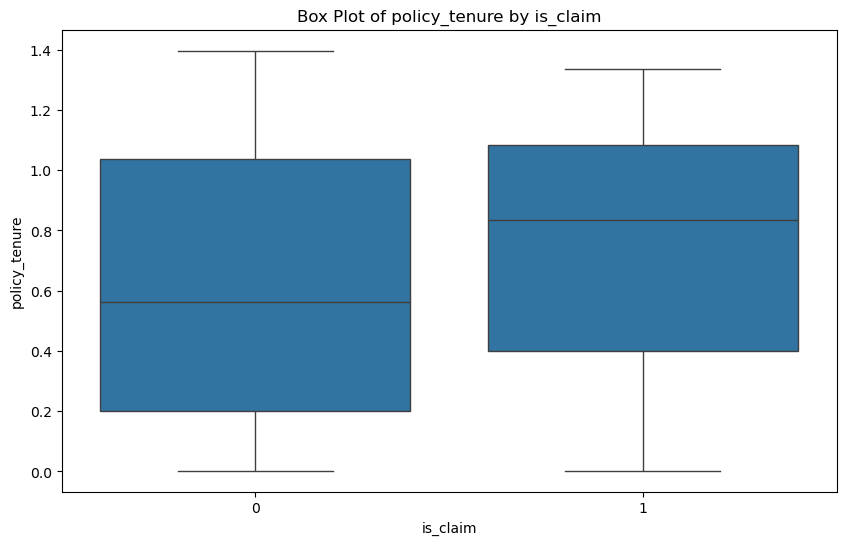

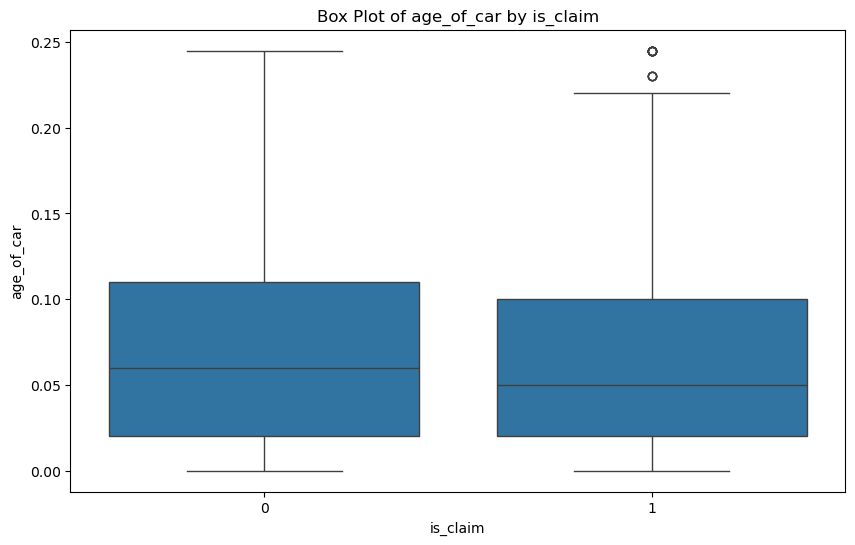

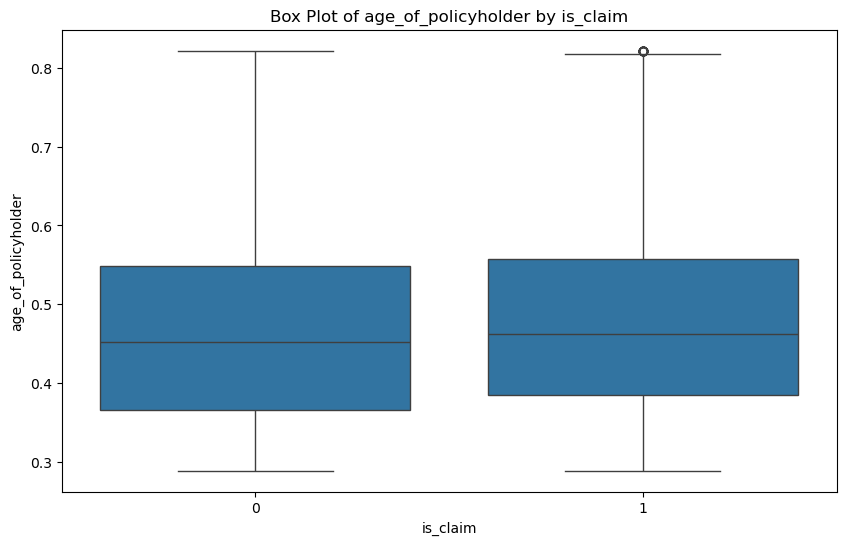

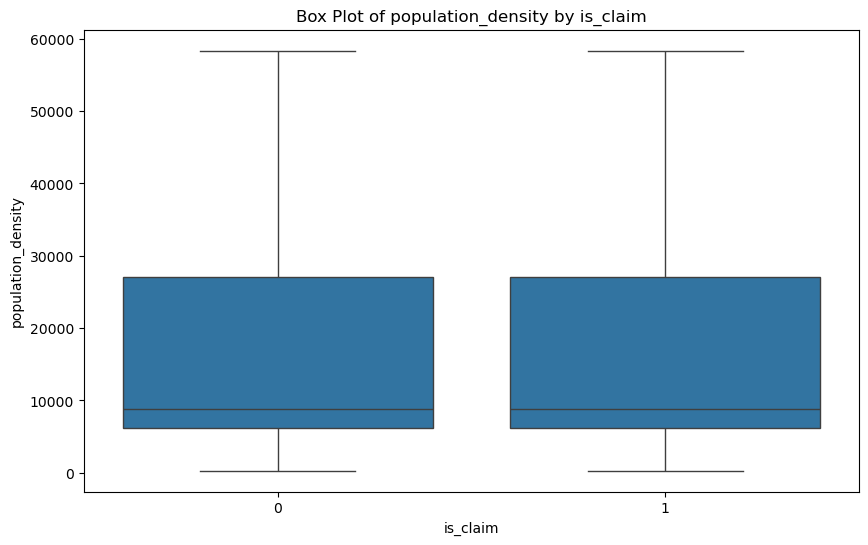

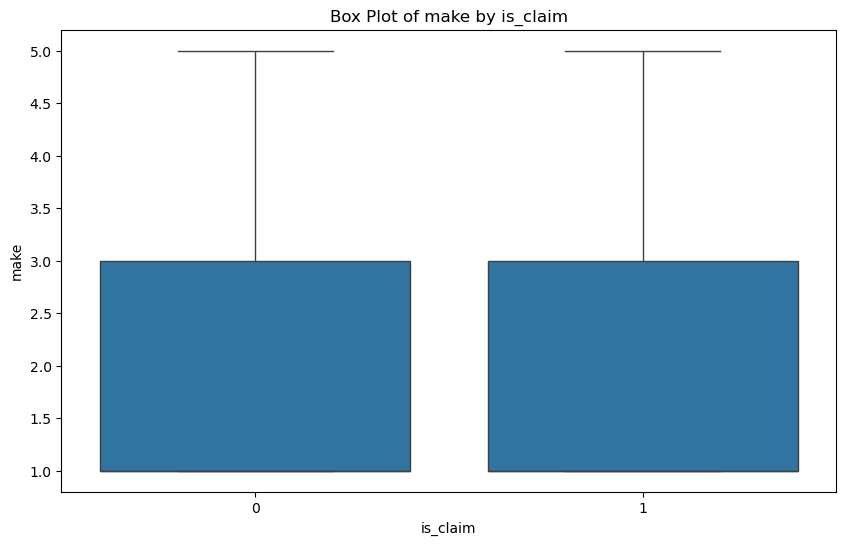

...

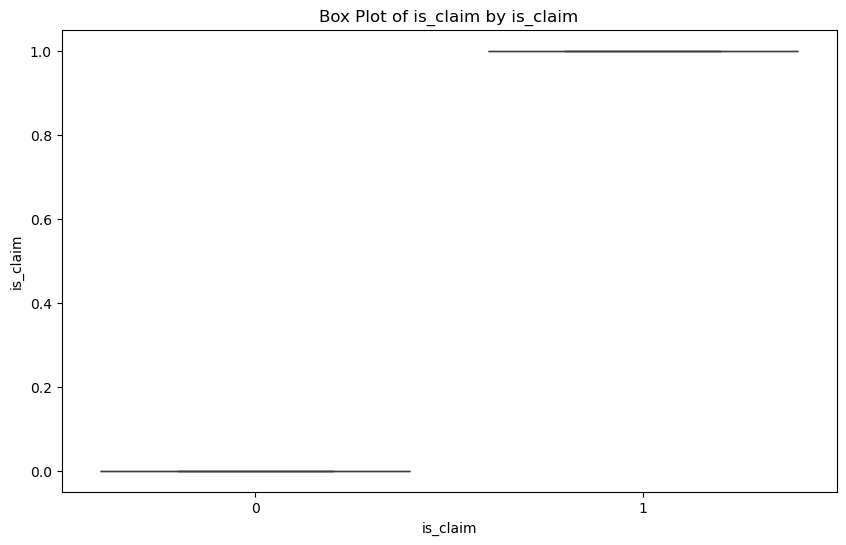

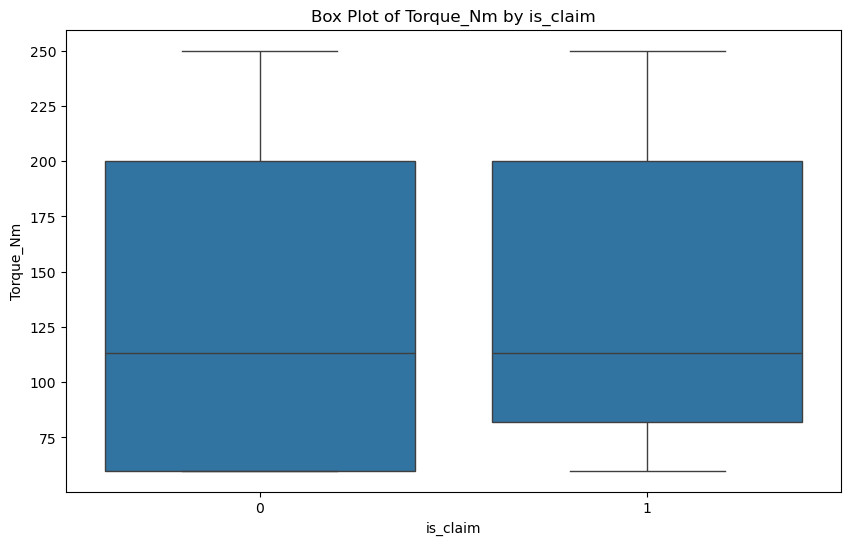

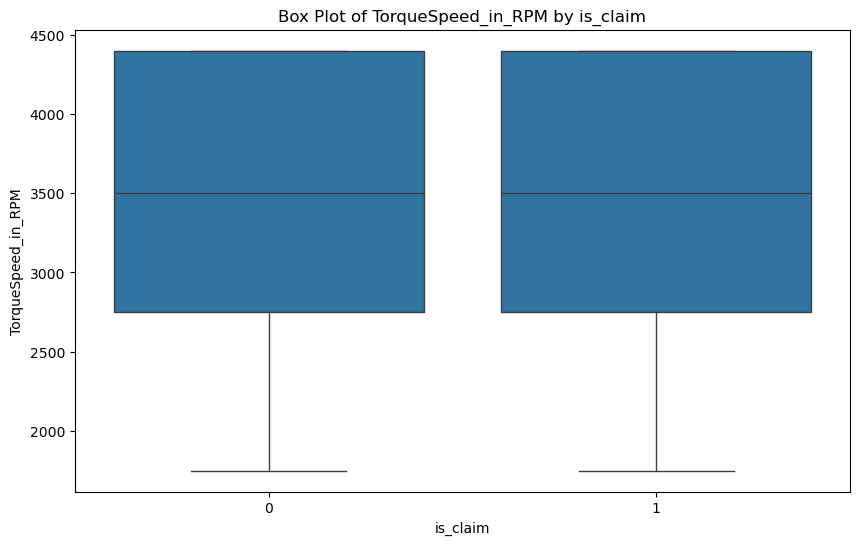

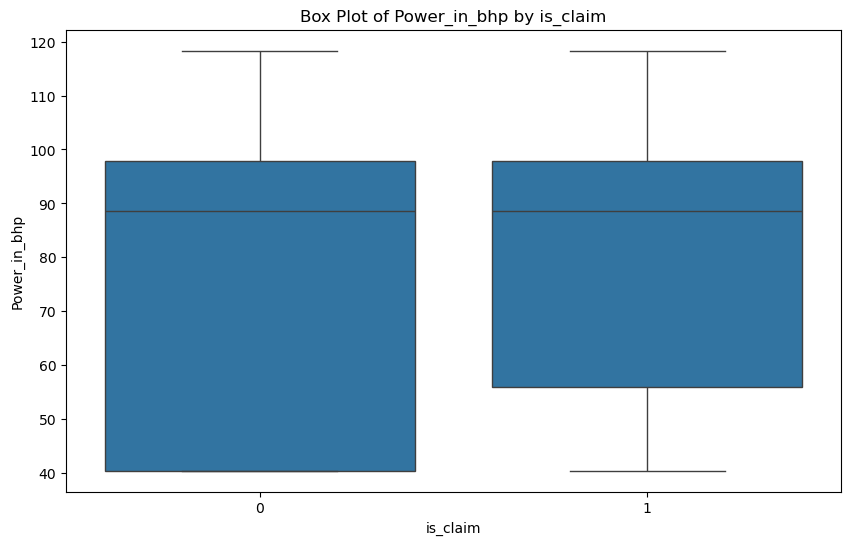

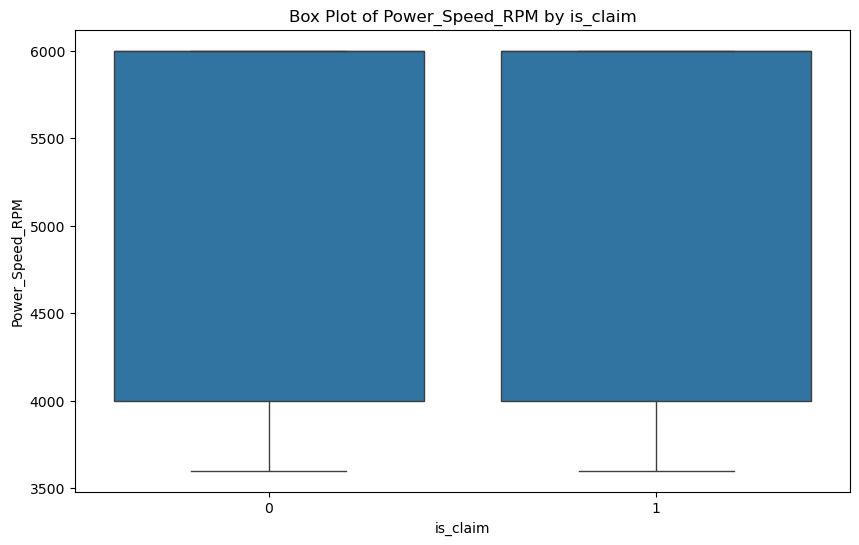

In [31]:
for feature in num_feature:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='is_claim', y=feature, data=df)
    plt.title(f'Box Plot of {feature} by is_claim')
    plt.show()


In [32]:
# Use a t-test (for binary target) or ANOVA (for multi-class target) to assess if the means of the numerical feature differ significantly between target groups.

from scipy.stats import ttest_ind
num_significant_to_target = []
num_Nonsignificant_to_target = []

for feature in num_feature:
    group0 = df[df['is_claim'] == 0][feature]
    group1 = df[df['is_claim'] == 1][feature]
    t_stat, p_value = ttest_ind(group0, group1)
    print(f'Feature: {feature}, p-value: {p_value}')
    if p_value>0.05:
        num_Nonsignificant_to_target.append(feature)
    else:
        num_significant_to_target.append(feature)

print()
print("So as per the above t-test test results we can see that p value is greater than 0.05 for the features : ",num_Nonsignificant_to_target) 
print()
print("So as per the above t-test test results we can see that p value is less than 0.05 for the features : ",num_significant_to_target)



Feature: policy_tenure, p-value: 3.0181155800813767e-81
Feature: age_of_car, p-value: 9.023007084421232e-12
Feature: age_of_policyholder, p-value: 6.562074232884411e-08
Feature: population_density, p-value: 5.806117183788131e-05
Feature: make, p-value: 0.9121488360536878
Feature: airbags, p-value: 0.4996526755376429
Feature: displacement, p-value: 0.06310215766252036
Feature: cylinder, p-value: 0.0011468318451899853
Feature: gear_box, p-value: 0.8777616296673278
Feature: turning_radius, p-value: 0.5096346505223106
Feature: length, p-value: 0.11594199374360714
Feature: width, p-value: 0.01605028483903441
Feature: height, p-value: 0.624273753492979
Feature: gross_weight, p-value: 0.3458577870636529
Feature: ncap_rating, p-value: 0.35766647542929053
Feature: is_claim, p-value: 0.0
Feature: Torque_Nm, p-value: 0.29861542507277306
Feature: TorqueSpeed_in_RPM, p-value: 0.2472148843391973
Feature: Power_in_bhp, p-value: 0.06242825494755467
Feature: Power_Speed_RPM, p-value: 0.9815945949310847

In [33]:
# To check the Significance of independent numerical variable to target variable by applying z test

from scipy.stats import norm

# Set the significance level
alpha = 0.05
num_Nonsignificant_to_target_z = []
num_significant_to_target_z = []

# Perform Z-test for each continuous feature with respect to the binary target
for feature in num_feature:
    if feature != 'is_claim':  # Skip the target column itself
        # Group the data by the target
        group_0 = df[df['is_claim'] == 0][feature]
        group_1 = df[df['is_claim'] == 1][feature]
        
        # Calculate sample means, standard deviations, and sizes
        mean_0 = group_0.mean()
        mean_1 = group_1.mean()
        std_0 = group_0.std(ddof=1)
        std_1 = group_1.std(ddof=1)
        n_0 = len(group_0)
        n_1 = len(group_1)
        
        # Calculate the Z-score
        z_score = (mean_0 - mean_1) / np.sqrt((std_0**2 / n_0) + (std_1**2 / n_1))
        
        # Calculate the p-value for the two-tailed Z-test
        p_value = 2 * (1 - norm.cdf(abs(z_score)))
        
        print(f"Feature: {feature}")
        print(f"Z-score: {z_score}")
        print(f"P-value: {p_value}")
        
        if p_value>0.05:
            num_Nonsignificant_to_target_z.append(feature)
        else:
            num_significant_to_target_z.append(feature)
        print("-" * 50)

print()
print("So as per the above t-test test results we can see that p value is greater than 0.05 for the features : ",num_Nonsignificant_to_target_z) 
print()
print("So as per the above t-test test results we can see that p value is less than 0.05 for the features : ",num_significant_to_target_z)


Feature: policy_tenure
Z-score: -20.198711485907275
P-value: 0.0
--------------------------------------------------
Feature: age_of_car
Z-score: 7.14941264298946
P-value: 8.715250743307479e-13
--------------------------------------------------
Feature: age_of_policyholder
Z-score: -5.281293036439677
P-value: 1.282753312459306e-07
--------------------------------------------------
Feature: population_density
Z-score: 4.294247813469546
P-value: 1.7528659883359055e-05
--------------------------------------------------
Feature: make
Z-score: 0.11011474689939756
P-value: 0.9123183729446813
--------------------------------------------------
Feature: airbags
Z-score: -0.6723982159776044
P-value: 0.5013302182427593
--------------------------------------------------
Feature: displacement
Z-score: -1.8739710660668885
P-value: 0.060934413205729454
--------------------------------------------------
Feature: cylinder
Z-score: -3.297135154504989
P-value: 0.0009767648607099666
-----------------------

### So as per the above t-test results we can see that p value is greater than 0.05 for the features make, airbags, gear_box, turning_radius, length, height, gross_weight, ncap_rating, Torque_Nm', 'TorqueSpeed_in_RPM', 'Power_in_bhp', and 'Power_Speed_RPM' is the features which is not relevant to the target columns so going forward it can be drop.

In [34]:
# A Chi-Square test to assess statistical significance Categorical Features vs. Categorical Target

from scipy.stats import chi2_contingency
cat_significant_to_target = []
cat_Nonsignificant_to_target = []

for feature in cat_feature:
    contingency_table = pd.crosstab(df[feature], df['is_claim'])
    chi2, p_value, _, _ = chi2_contingency(contingency_table)
    print(f'Feature: {feature}, p-value: {p_value}')
    if p_value>0.05:
        cat_Nonsignificant_to_target.append(feature)
    else:
        cat_significant_to_target.append(feature)

print()
print("So as per the above chi2_contingency test results we can see that p value is greater than 0.05 for the features : ",cat_Nonsignificant_to_target) 
print()
print("So as per the above chi2_contingency test results we can see that p value is less than 0.05 for the features : ",cat_significant_to_target)


Feature: policy_id, p-value: 0.49805766086832093
Feature: area_cluster, p-value: 1.412557511595789e-11
Feature: segment, p-value: 0.02738747673628079
Feature: model, p-value: 0.02949022219663932
Feature: fuel_type, p-value: 0.056145343695656484
Feature: engine_type, p-value: 0.029490222196639326
Feature: is_esc, p-value: 0.47973082296004166
Feature: is_adjustable_steering, p-value: 0.0008041954126638532
Feature: is_tpms, p-value: 0.8804734284234931
Feature: is_parking_sensors, p-value: 0.046026600078480424
Feature: is_parking_camera, p-value: 0.8464941782641769
Feature: rear_brakes_type, p-value: 0.8804734284234931
Feature: transmission_type, p-value: 0.8913806451098147
Feature: steering_type, p-value: 0.05680882959490323
Feature: is_front_fog_lights, p-value: 0.004438415801344458
Feature: is_rear_window_wiper, p-value: 0.5332800461995457
Feature: is_rear_window_washer, p-value: 0.5332800461995457
Feature: is_rear_window_defogger, p-value: 0.5426511057939621
Feature: is_brake_assist, p

In [35]:
print(cat_feature)

['policy_id', 'area_cluster', 'segment', 'model', 'fuel_type', 'engine_type', 'is_esc', 'is_adjustable_steering', 'is_tpms', 'is_parking_sensors', 'is_parking_camera', 'rear_brakes_type', 'transmission_type', 'steering_type', 'is_front_fog_lights', 'is_rear_window_wiper', 'is_rear_window_washer', 'is_rear_window_defogger', 'is_brake_assist', 'is_power_door_locks', 'is_central_locking', 'is_power_steering', 'is_driver_seat_height_adjustable', 'is_day_night_rear_view_mirror', 'is_ecw', 'is_speed_alert']


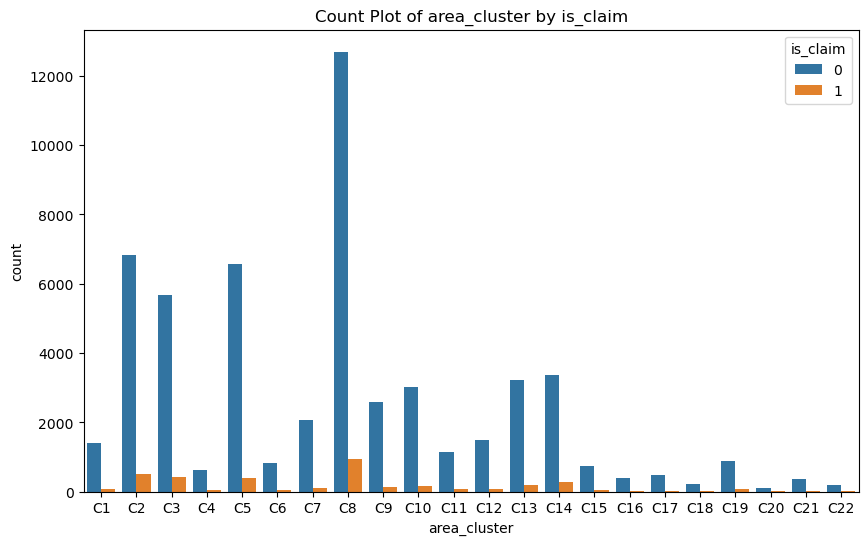

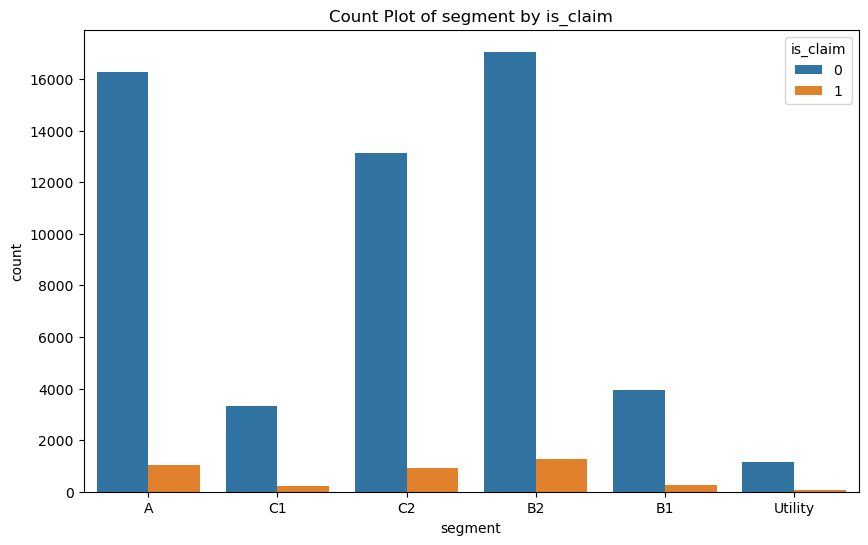

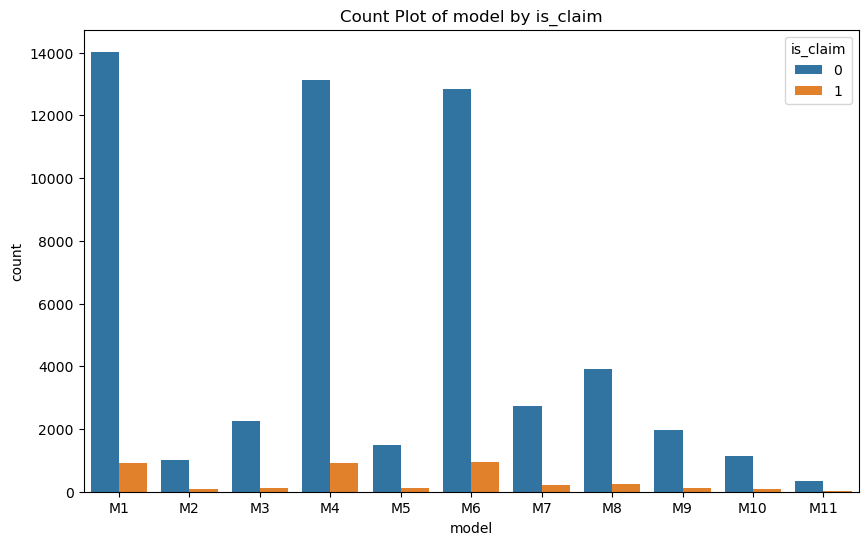

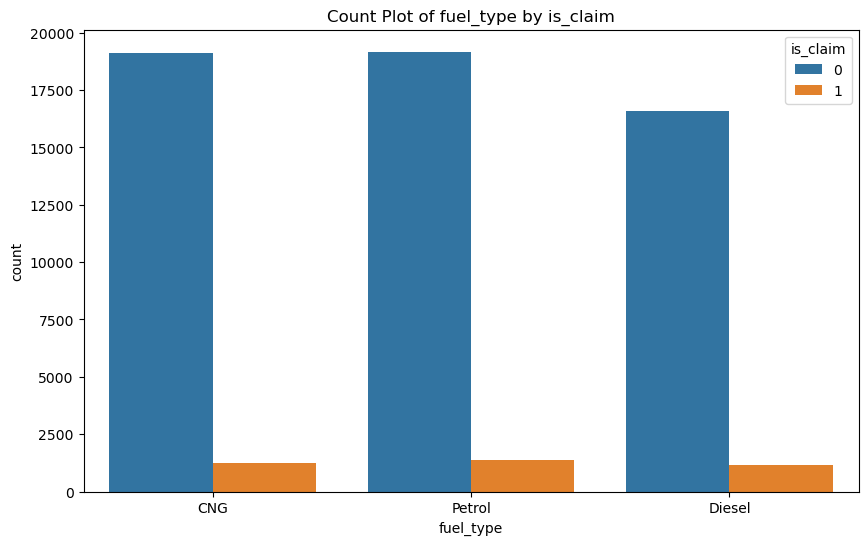

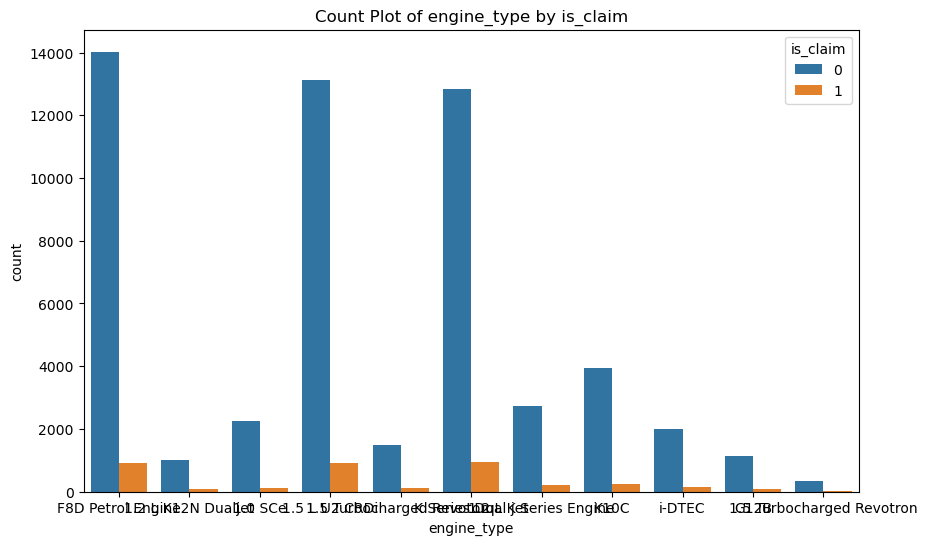

...

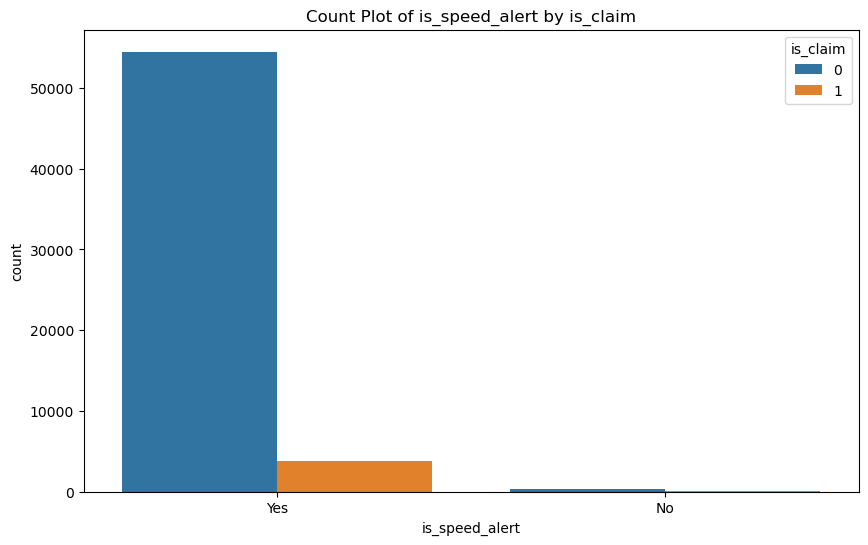

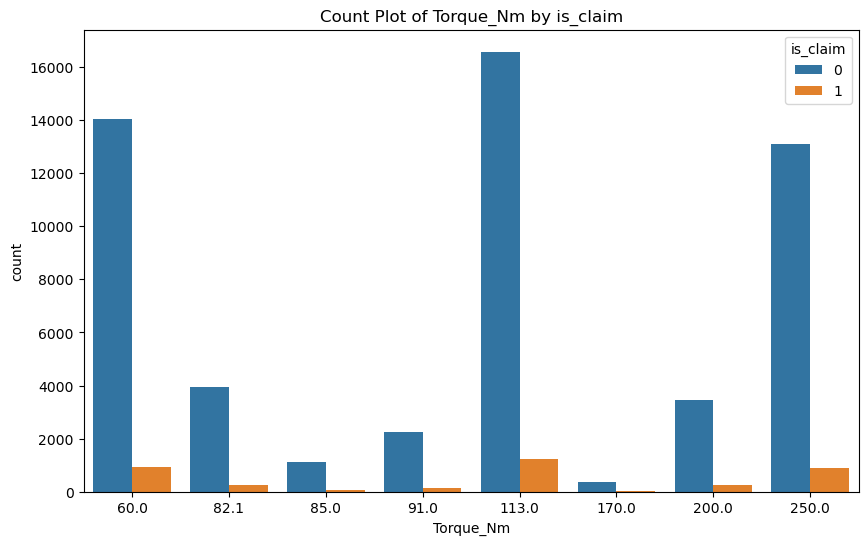

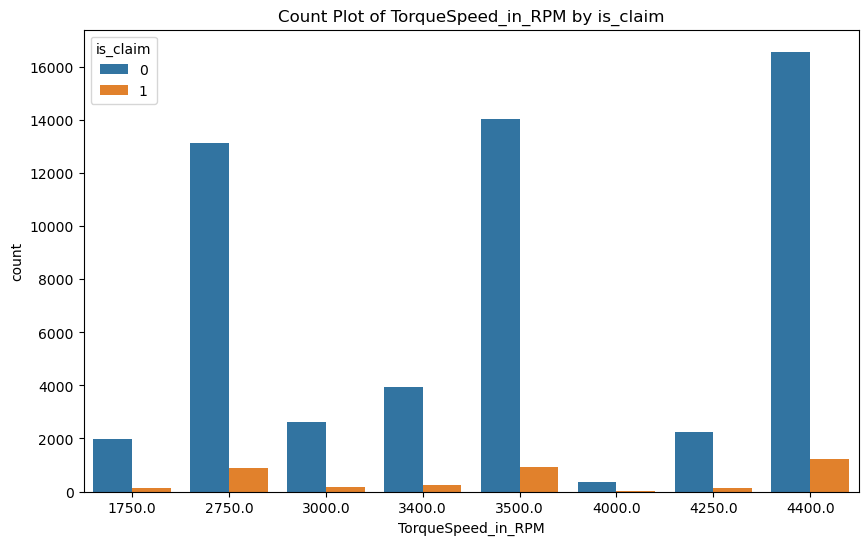

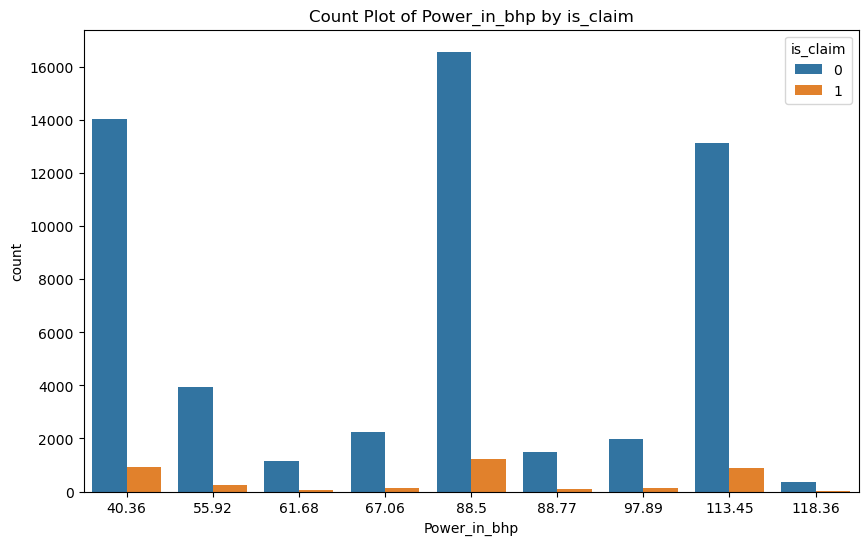

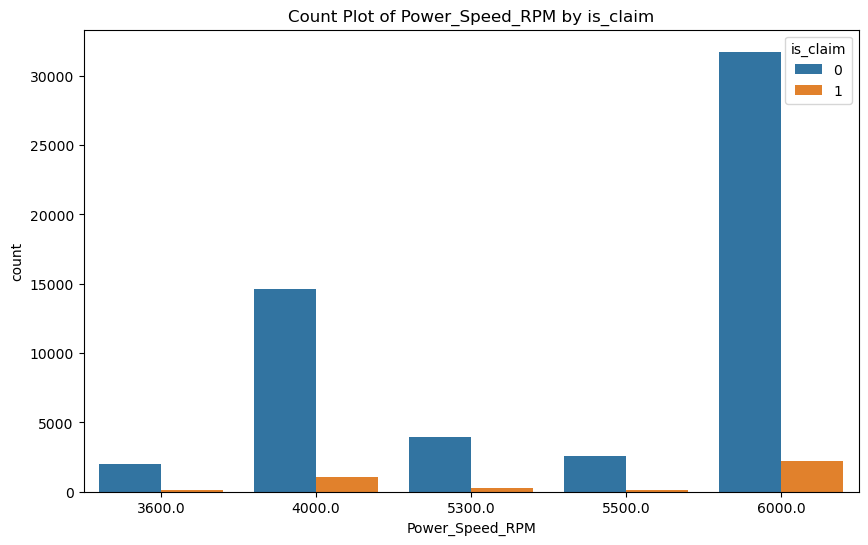

In [36]:
# To see the for each category how target columns is distibuted 

for feature in ['area_cluster', 'segment', 'model', 'fuel_type', 'engine_type', 'is_esc', 'is_adjustable_steering', 'is_tpms', 'is_parking_sensors', 'is_parking_camera', 'rear_brakes_type', 'transmission_type', 'steering_type', 'is_front_fog_lights', 'is_rear_window_wiper', 'is_rear_window_washer', 'is_rear_window_defogger', 'is_brake_assist', 'is_power_door_locks', 'is_central_locking', 'is_power_steering', 'is_driver_seat_height_adjustable', 'is_day_night_rear_view_mirror', 'is_ecw', 'is_speed_alert', 'Torque_Nm', 'TorqueSpeed_in_RPM', 'Power_in_bhp', 'Power_Speed_RPM']:
    
    plt.figure(figsize=(10, 6))
    sns.countplot(x=feature, hue='is_claim', data=df)
    plt.title(f'Count Plot of {feature} by is_claim')
    plt.show()

In [37]:
df.columns

Index(['policy_id', 'policy_tenure', 'age_of_car', 'age_of_policyholder',
       'area_cluster', 'population_density', 'make', 'segment', 'model',
       'fuel_type', 'engine_type', 'airbags', 'is_esc',
       'is_adjustable_steering', 'is_tpms', 'is_parking_sensors',
       'is_parking_camera', 'rear_brakes_type', 'displacement', 'cylinder',
       'transmission_type', 'gear_box', 'steering_type', 'turning_radius',
       'length', 'width', 'height', 'gross_weight', 'is_front_fog_lights',
       'is_rear_window_wiper', 'is_rear_window_washer',
       'is_rear_window_defogger', 'is_brake_assist', 'is_power_door_locks',
       'is_central_locking', 'is_power_steering',
       'is_driver_seat_height_adjustable', 'is_day_night_rear_view_mirror',
       'is_ecw', 'is_speed_alert', 'ncap_rating', 'is_claim', 'Torque_Nm',
       'TorqueSpeed_in_RPM', 'Power_in_bhp', 'Power_Speed_RPM'],
      dtype='object')

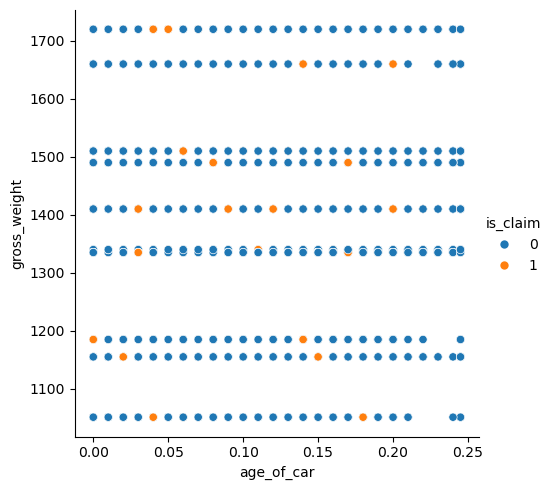

In [38]:
sns.relplot(x='age_of_car', y='gross_weight', data=df, hue='is_claim', kind='scatter',height=5)
plt.show()

In [39]:
print("Continues numbers are: ",continues_num)
print(end='\n')
print("discrete numbers are: ",discrete_num)
print(end='\n')
print("High Category columns are",Highcategory_obj)
print(end='\n')
print("Low Category columns are", Lowcategory_obj)

Continues numbers are:  ['policy_tenure', 'age_of_car', 'age_of_policyholder', 'population_density', 'width', 'height', 'gross_weight']

discrete numbers are:  ['make', 'airbags', 'displacement', 'cylinder', 'gear_box', 'turning_radius', 'length', 'ncap_rating', 'is_claim', 'Torque_Nm', 'TorqueSpeed_in_RPM', 'Power_in_bhp', 'Power_Speed_RPM']

High Category columns are ['policy_id', 'area_cluster']

Low Category columns are ['segment', 'model', 'fuel_type', 'engine_type', 'is_esc', 'is_adjustable_steering', 'is_tpms', 'is_parking_sensors', 'is_parking_camera', 'rear_brakes_type', 'transmission_type', 'steering_type', 'is_front_fog_lights', 'is_rear_window_wiper', 'is_rear_window_washer', 'is_rear_window_defogger', 'is_brake_assist', 'is_power_door_locks', 'is_central_locking', 'is_power_steering', 'is_driver_seat_height_adjustable', 'is_day_night_rear_view_mirror', 'is_ecw', 'is_speed_alert']


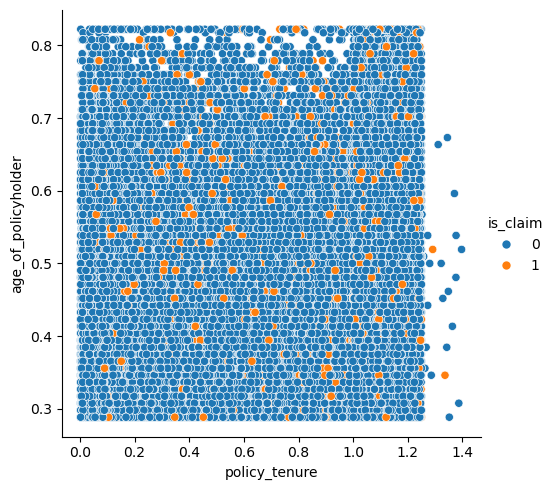

In [40]:
sns.relplot(x='policy_tenure', y='age_of_policyholder', data=df, hue='is_claim', kind='scatter',height=5)
plt.show()

In [41]:
# Extract a single column and create a new DataFrame

df1 = pd.DataFrame(df[['policy_tenure', 'age_of_car', 'age_of_policyholder', 'population_density', 'width', 'height', 'gross_weight','is_claim']])

df1.head()


,policy_tenure,age_of_car,age_of_policyholder,population_density,width,height,gross_weight,is_claim
0,0.515874,0.05,0.644231,4990.0,1515,1475,1185,0
1,0.672619,0.02,0.375000,27003.0,1515,1475,1185,0
2,0.841110,0.02,0.384615,4076.0,1515,1475,1185,0
3,0.900277,0.11,0.432692,21622.0,1735,1515,1335,0
4,0.596403,0.11,0.634615,34738.0,1579,1490,1155,0


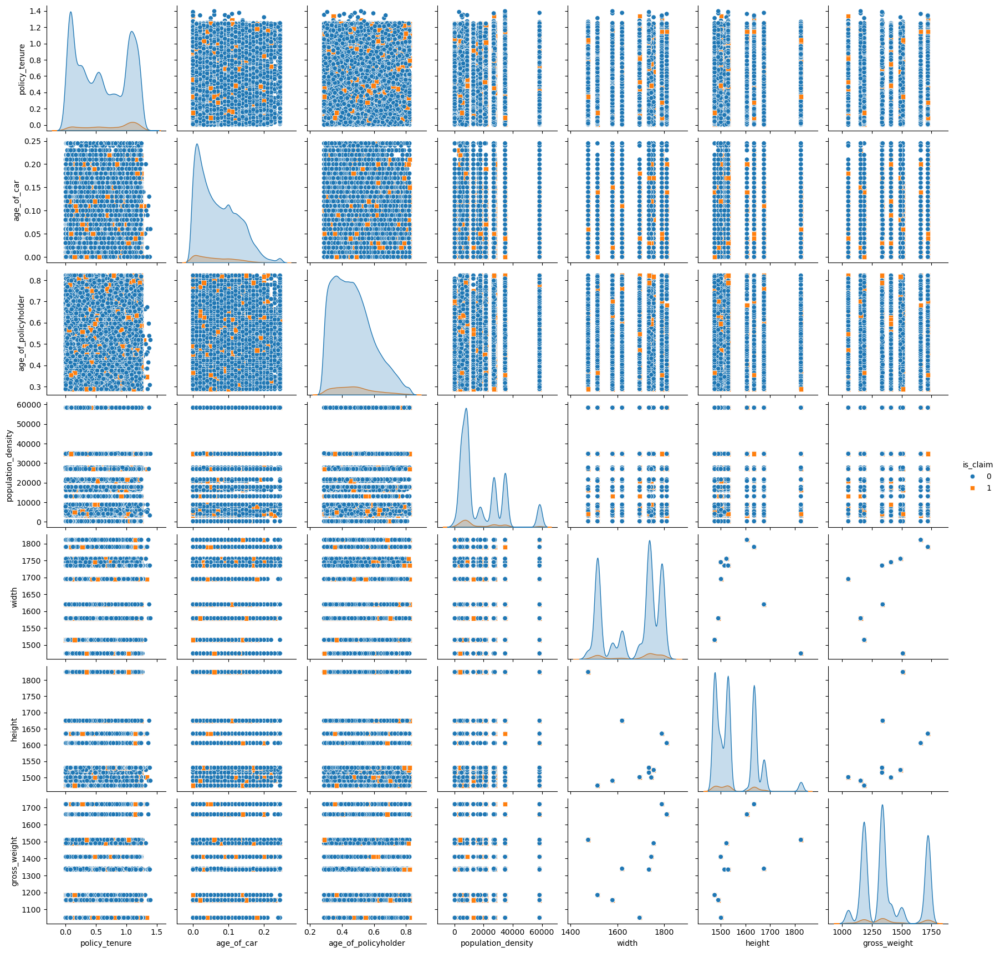

In [42]:
sns.pairplot(data=df1, hue='is_claim', diag_kind='kde', markers=['o', 's'])
plt.show()

#### Hence data is spread for numerical continues variable for the target coulmn hence we are dropping a column using the above tests and checking the model.

In [43]:
df.columns

Index(['policy_id', 'policy_tenure', 'age_of_car', 'age_of_policyholder',
       'area_cluster', 'population_density', 'make', 'segment', 'model',
       'fuel_type', 'engine_type', 'airbags', 'is_esc',
       'is_adjustable_steering', 'is_tpms', 'is_parking_sensors',
       'is_parking_camera', 'rear_brakes_type', 'displacement', 'cylinder',
       'transmission_type', 'gear_box', 'steering_type', 'turning_radius',
       'length', 'width', 'height', 'gross_weight', 'is_front_fog_lights',
       'is_rear_window_wiper', 'is_rear_window_washer',
       'is_rear_window_defogger', 'is_brake_assist', 'is_power_door_locks',
       'is_central_locking', 'is_power_steering',
       'is_driver_seat_height_adjustable', 'is_day_night_rear_view_mirror',
       'is_ecw', 'is_speed_alert', 'ncap_rating', 'is_claim', 'Torque_Nm',
       'TorqueSpeed_in_RPM', 'Power_in_bhp', 'Power_Speed_RPM'],
      dtype='object')

In [44]:
# Dropping the insignificant column by using p-value and pie-chart

df2 = df.drop(['policy_id', 'fuel_type', 'is_esc', 'is_tpms', 'is_parking_camera', 'rear_brakes_type', 'transmission_type', 'steering_type', 'is_rear_window_wiper', 'is_rear_window_washer', 'is_rear_window_defogger', 'is_power_door_locks', 'is_central_locking', 'is_power_steering', 'is_day_night_rear_view_mirror', 'is_ecw', 'is_speed_alert','make', 'airbags', 'displacement', 'gear_box', 'turning_radius', 'length', 'height', 'gross_weight', 'ncap_rating', 'is_parking_sensors', 'Torque_Nm', 'TorqueSpeed_in_RPM', 'Power_in_bhp', 'Power_Speed_RPM'], axis=1)
df2.head()

,policy_tenure,age_of_car,age_of_policyholder,area_cluster,population_density,segment,model,engine_type,is_adjustable_steering,cylinder,width,is_front_fog_lights,is_brake_assist,is_driver_seat_height_adjustable,is_claim
0,0.515874,0.05,0.644231,C1,4990.0,A,M1,F8D Petrol Engine,No,3,1515,No,No,No,0
1,0.672619,0.02,0.375000,C2,27003.0,A,M1,F8D Petrol Engine,No,3,1515,No,No,No,0
2,0.841110,0.02,0.384615,C3,4076.0,A,M1,F8D Petrol Engine,No,3,1515,No,No,No,0
3,0.900277,0.11,0.432692,C4,21622.0,C1,M2,1.2 L K12N Dualjet,Yes,4,1735,Yes,Yes,Yes,0
4,0.596403,0.11,0.634615,C5,34738.0,A,M3,1.0 SCe,No,3,1579,No,No,No,0


In [45]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58592 entries, 0 to 58591
Data columns (total 15 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   policy_tenure                     58592 non-null  float64
 1   age_of_car                        58592 non-null  float64
 2   age_of_policyholder               58592 non-null  float64
 3   area_cluster                      58592 non-null  object 
 4   population_density                58592 non-null  float64
 5   segment                           58592 non-null  object 
 6   model                             58592 non-null  object 
 7   engine_type                       58592 non-null  object 
 8   is_adjustable_steering            58592 non-null  object 
 9   cylinder                          58592 non-null  int64  
 10  width                             58592 non-null  int64  
 11  is_front_fog_lights               58592 non-null  object 
 12  is_b

In [46]:
# To split the variables in categrical and numerical to check the feature importnace with numeriacl and categorical with the target variable

num_feature_1=[]
cat_feature_1=[]
for i in df2.columns:
    if df2[i].dtype=='object':
        cat_feature_1.append(i)  
    else:
        num_feature_1.append(i)

print(cat_feature_1)
print()
print(num_feature_1)

['area_cluster', 'segment', 'model', 'engine_type', 'is_adjustable_steering', 'is_front_fog_lights', 'is_brake_assist', 'is_driver_seat_height_adjustable']

['policy_tenure', 'age_of_car', 'age_of_policyholder', 'population_density', 'cylinder', 'width', 'is_claim']


In [56]:
x = df2.drop('is_claim', axis=1)

In [57]:
y = df2['is_claim']

In [58]:
# Encoded the independent categorical data and fit the training data separately and transform the train and test data to avoid data leackage

from sklearn.preprocessing import LabelEncoder

# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the training data (X_train)
for col in cat_feature_1:
    # Fit LabelEncoder to the column in training data
    label_encoder.fit(x[col])
    
    # Transform both the training and test data
    x[f'encoded_{col}'] = label_encoder.transform(x[col])
    #x_test[f'encoded_{col}'] = label_encoder.transform(x_test[col])

# Check the columns of the updated x_train and x_test
print(x.columns)
#print(x_test.columns)


Index(['policy_tenure', 'age_of_car', 'age_of_policyholder', 'area_cluster',
       'population_density', 'segment', 'model', 'engine_type',
       'is_adjustable_steering', 'cylinder', 'width', 'is_front_fog_lights',
       'is_brake_assist', 'is_driver_seat_height_adjustable',
       'encoded_area_cluster', 'encoded_segment', 'encoded_model',
       'encoded_engine_type', 'encoded_is_adjustable_steering',
       'encoded_is_front_fog_lights', 'encoded_is_brake_assist',
       'encoded_is_driver_seat_height_adjustable'],
      dtype='object')


In [55]:
x

,policy_tenure,age_of_car,age_of_policyholder,area_cluster,population_density,segment,model,engine_type,is_adjustable_steering,cylinder,...,is_brake_assist,is_driver_seat_height_adjustable,encoded_area_cluster,encoded_segment,encoded_model,encoded_engine_type,encoded_is_adjustable_steering,encoded_is_front_fog_lights,encoded_is_brake_assist,encoded_is_driver_seat_height_adjustable
0,0.515874,0.05,0.644231,C1,4990.0,A,M1,F8D Petrol Engine,No,3,...,No,No,0,0,0,6,0,0,0,0
1,0.672619,0.02,0.375000,C2,27003.0,A,M1,F8D Petrol Engine,No,3,...,No,No,11,0,0,6,0,0,0,0
2,0.841110,0.02,0.384615,C3,4076.0,A,M1,F8D Petrol Engine,No,3,...,No,No,15,0,0,6,0,0,0,0
3,0.900277,0.11,0.432692,C4,21622.0,C1,M2,1.2 L K12N Dualjet,Yes,4,...,Yes,Yes,16,3,3,2,1,1,1,1
4,0.596403,0.11,0.634615,C5,34738.0,A,M3,1.0 SCe,No,3,...,No,No,17,0,4,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58587,0.355089,0.13,0.644231,C8,8794.0,A,M3,1.0 SCe,No,3,...,No,No,20,0,4,0,0,0,0,0
58588,1.199642,0.02,0.519231,C14,7788.0,A,M1,F8D Petrol Engine,No,3,...,No,No,5,0,0,6,0,0,0,0
58589,1.162273,0.05,0.451923,C5,34738.0,A,M1,F8D Petrol Engine,No,3,...,No,No,17,0,0,6,0,0,0,0
58590,1.236307,0.14,0.557692,C8,8794.0,B2,M6,K Series Dual jet,Yes,4,...,Yes,Yes,20,2,7,8,1,1,1,1


In [59]:
x = x.drop(['area_cluster', 'segment', 'model',
       'engine_type', 'is_adjustable_steering',
       'is_front_fog_lights', 'is_brake_assist',
       'is_driver_seat_height_adjustable'], axis=1)
x

,policy_tenure,age_of_car,age_of_policyholder,population_density,cylinder,width,encoded_area_cluster,encoded_segment,encoded_model,encoded_engine_type,encoded_is_adjustable_steering,encoded_is_front_fog_lights,encoded_is_brake_assist,encoded_is_driver_seat_height_adjustable
0,0.515874,0.05,0.644231,4990.0,3,1515,0,0,0,6,0,0,0,0
1,0.672619,0.02,0.375000,27003.0,3,1515,11,0,0,6,0,0,0,0
2,0.841110,0.02,0.384615,4076.0,3,1515,15,0,0,6,0,0,0,0
3,0.900277,0.11,0.432692,21622.0,4,1735,16,3,3,2,1,1,1,1
4,0.596403,0.11,0.634615,34738.0,3,1579,17,0,4,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58587,0.355089,0.13,0.644231,8794.0,3,1579,20,0,4,0,0,0,0,0
58588,1.199642,0.02,0.519231,7788.0,3,1515,5,0,0,6,0,0,0,0
58589,1.162273,0.05,0.451923,34738.0,3,1515,17,0,0,6,0,0,0,0
58590,1.236307,0.14,0.557692,8794.0,4,1735,20,2,7,8,1,1,1,1


In [66]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x,y,random_state=42)

In [67]:
# Used standard scalerto scaled the X1 data

from sklearn.preprocessing import StandardScaler

# Initialize scaler
scaler = StandardScaler()

# Fit and transform the data
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)
print(x_train_scaled)
print(x_test_scaled)

[[ 0.12229236  0.20032129  0.01290801 ...  0.8519777   0.90595708
   0.84151956]
 [-0.9809681  -1.07033405 -0.92803152 ... -1.17373965 -1.10380505
  -1.1883265 ]
 [ 0.38968828 -1.07033405  1.89478708 ... -1.17373965 -1.10380505
  -1.1883265 ]
 ...
 [ 1.39371822  1.10793224 -1.1632664  ...  0.8519777   0.90595708
   0.84151956]
 [-1.42208887 -1.25185624  1.89478708 ... -1.17373965 -1.10380505
  -1.1883265 ]
 [-0.91428235 -1.25185624  0.09131964 ... -1.17373965 -1.10380505
  -1.1883265 ]]
[[-0.78890506 -0.34424529  0.32655452 ...  0.8519777  -1.10380505
   0.84151956]
 [-1.18317    -0.34424529 -0.53597338 ...  0.8519777   0.90595708
   0.84151956]
 [-0.9642085  -0.70728967 -0.84961989 ...  0.8519777   0.90595708
   0.84151956]
 ...
 [-1.28352049  1.47097662 -1.08485477 ...  0.8519777   0.90595708
   0.84151956]
 [-0.42779043  0.38184348 -0.06550361 ...  0.8519777   0.90595708
   0.84151956]
 [ 1.14875976 -0.34424529  1.03225917 ...  0.8519777   0.90595708
   0.84151956]]


In [68]:
x1 = pd.DataFrame(x_train_scaled, columns=x_train.columns)
x1

,policy_tenure,age_of_car,age_of_policyholder,population_density,cylinder,width,encoded_area_cluster,encoded_segment,encoded_model,encoded_engine_type,encoded_is_adjustable_steering,encoded_is_front_fog_lights,encoded_is_brake_assist,encoded_is_driver_seat_height_adjustable
0,0.122292,0.200321,0.012908,-0.916863,0.770728,0.559158,0.292749,0.038528,0.727779,0.926922,0.804679,0.851978,0.905957,0.841520
1,-0.980968,-1.070334,-0.928032,1.107214,-1.297474,-1.407927,0.586443,-1.240707,-1.462457,0.183048,-1.242731,-1.173740,-1.103805,-1.188327
2,0.389688,-1.070334,1.894787,-0.916863,-1.297474,-1.407927,0.292749,-1.240707,-1.462457,0.183048,-1.242731,-1.173740,-1.103805,-1.188327
3,-0.269488,1.470977,0.404966,0.596607,-1.297474,-0.469091,-0.294640,-0.601090,1.353560,1.298858,-1.242731,-1.173740,-1.103805,-1.188327
4,-1.306612,0.018799,0.718613,-0.605415,0.770728,-1.765579,1.026984,1.957380,-1.149566,0.554985,-1.242731,-1.173740,-1.103805,-1.188327
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43939,1.489472,2.197065,-0.143915,-0.605415,0.770728,1.050929,1.026984,1.317763,0.101997,-0.932762,0.804679,0.851978,0.905957,0.841520
43940,-0.403108,-1.251856,0.404966,-0.916863,-1.297474,-1.407927,0.292749,-1.240707,-1.462457,0.183048,-1.242731,-1.173740,-1.103805,-1.188327
43941,1.393718,1.107932,-1.163266,-0.605415,0.770728,0.559158,1.026984,0.038528,0.727779,0.926922,0.804679,0.851978,0.905957,0.841520
43942,-1.422089,-1.251856,1.894787,1.107214,-1.297474,-1.407927,0.586443,-1.240707,-1.462457,0.183048,-1.242731,-1.173740,-1.103805,-1.188327


In [75]:
# Since this is an imbalnce problem it is need to balance using smote oversampling technique to avoid data loss

from imblearn.over_sampling import SMOTE

smote = SMOTE()
x_resampled, y_resampled = smote.fit_resample(x_train_scaled, y_train)
x_resampled

array([[ 0.12229236,  0.20032129,  0.01290801, ...,  0.8519777 ,
         0.90595708,  0.84151956],
       [-0.9809681 , -1.07033405, -0.92803152, ..., -1.17373965,
        -1.10380505, -1.1883265 ],
       [ 0.38968828, -1.07033405,  1.89478708, ..., -1.17373965,
        -1.10380505, -1.1883265 ],
       ...,
       [ 0.90309462, -0.40016495,  1.32175022, ..., -1.17373965,
        -1.10380505, -1.1883265 ],
       [-0.37986307, -1.03199532, -1.22511696, ..., -1.17373965,
        -1.10380505, -1.1883265 ],
       [-1.15096722, -1.25185624, -0.54668783, ..., -1.17373965,
        -1.10380505, -1.1883265 ]])

In [76]:
# Since this is an imbalnce problem it is need to balance using smote oversampling technique to avoid data loss

from imblearn.over_sampling import SMOTE

smote = SMOTE()
x_resampled_test, y_resampled_test = smote.fit_resample(x_test_scaled, y_test)
x_resampled_test

array([[-0.78890506, -0.34424529,  0.32655452, ...,  0.8519777 ,
        -1.10380505,  0.84151956],
       [-1.18317   , -0.34424529, -0.53597338, ...,  0.8519777 ,
         0.90595708,  0.84151956],
       [-0.9642085 , -0.70728967, -0.84961989, ...,  0.8519777 ,
         0.90595708,  0.84151956],
       ...,
       [ 1.33555285,  0.73641249,  0.21366426, ..., -1.17373965,
        -1.10380505, -1.1883265 ],
       [-0.36157549, -1.12936048, -1.47691291, ..., -1.17373965,
        -1.10380505, -1.1883265 ],
       [ 1.06688398, -0.22707008, -1.0939828 , ...,  0.8519777 ,
         0.90595708,  0.84151956]])

## Model selection and model building

In [77]:
# Importing various model for classification and evaluation matrix

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

### Logistic Regression

In [79]:
# Fitting the model for trained data for logistic regression model

model_LR = LogisticRegression()
model_LR.fit(x_train_scaled, y_train)

LogisticRegression()

In [80]:
y_test_predict_LR = model_LR.predict(x_test_scaled)
y_train_predict_LR = model_LR.predict(x_train_scaled)

In [82]:
test_accuracy_LR = accuracy_score(y_test, y_test_predict_LR)
train_accuracy_LR = accuracy_score(y_train, y_train_predict_LR)
print(f'{test_accuracy_LR:.2f}')
print(f'{train_accuracy_LR:.2f}')

0.93
0.94


### Decision Tree

In [83]:
# Fitting the model for trained data for Decision Tree model

model_dt = DecisionTreeClassifier()
model_dt.fit(x_train_scaled, y_train)

DecisionTreeClassifier()

In [84]:
y_test_predict_dt = model_dt.predict(x_test_scaled)
y_train_predict_dt = model_dt.predict(x_train_scaled)

In [86]:
test_accuracy_dt = accuracy_score(y_test, y_test_predict_dt)
train_accuracy_dt = accuracy_score(y_train, y_train_predict_dt)
print(f'{test_accuracy_dt:.2f}')
print(f'{train_accuracy_dt:.2f}')

0.87
1.00


### Random Forest

In [88]:
# Fitting the model for trained data for RandomForest model

model_rf = RandomForestClassifier()
model_rf.fit(x_train_scaled, y_train)

RandomForestClassifier()

In [89]:
y_test_predict_rf = model_dt.predict(x_test_scaled)
y_train_predict_rf = model_dt.predict(x_train_scaled)

In [90]:
test_accuracy_rf = accuracy_score(y_test, y_test_predict_rf)
train_accuracy_rf = accuracy_score(y_train, y_train_predict_rf)
print(f'{test_accuracy_rf:.2f}')
print(f'{train_accuracy_rf:.2f}')

0.87
1.00


### Random Forest with Cross Validation

In [91]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
import numpy as np

# Assuming x_train_scaled and y_train_scaled are your feature and target data respectively

# Initialize Random Forest Classifier
model_rfcv = RandomForestClassifier()

# Perform cross-validation (e.g., 5-fold cross-validation)
cv_scores = cross_val_score(model_rfcv, x_train_scaled, y_train, cv=5, scoring='accuracy')  # Use 'accuracy' for classification tasks

# Print the cross-validation scores for each fold
print(f"Cross-validation training scores: {cv_scores}")

# Print the mean and standard deviation of the cross-validation scores
print(f"Mean accuracy training: {np.mean(cv_scores)}")
print(f"Standard deviation training: {np.std(cv_scores)}")


Cross-validation training scores: [0.93321197 0.93321197 0.93309819 0.93332575 0.93297679]
Mean accuracy training: 0.9331649329112874
Standard deviation training: 0.00011843982524645347


In [92]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
import numpy as np

# Assuming x_train_scaled and y_train_scaled are your feature and target data respectively

# Initialize Random Forest Classifier
model_rfcv = RandomForestClassifier()

# Perform cross-validation (e.g., 5-fold cross-validation)
cv_scores = cross_val_score(model_rfcv, x_test_scaled, y_test, cv=5, scoring='accuracy')  # Use 'accuracy' for classification tasks

# Print the cross-validation scores for each fold
print(f"Cross-validation testing scores: {cv_scores}")

# Print the mean and standard deviation of the cross-validation scores
print(f"Mean accuracy testing: {np.mean(cv_scores)}")
print(f"Standard deviation testing: {np.std(cv_scores)}")


Cross-validation testing scores: [0.93105802 0.92969283 0.93242321 0.93205872 0.93001024]
Mean accuracy testing: 0.9310486053901377
Standard deviation testing: 0.0010794699091800498


### KNN Classifier

In [93]:
# Fitting the model for trained data for KNN model

model_kc = KNeighborsClassifier()
model_kc.fit(x_train_scaled, y_train)

KNeighborsClassifier()

In [94]:
y_test_predict_kc = model_kc.predict(x_test_scaled)
y_train_predict_kc = model_kc.predict(x_train_scaled)

In [96]:
test_accuracy_kc = accuracy_score(y_test, y_test_predict_kc)
train_accuracy_kc = accuracy_score(y_train, y_train_predict_kc)
print(f'{test_accuracy_kc:.2f}')
print(f'{train_accuracy_kc:.2f}')

0.93
0.94


### XGB Classifier

In [98]:
# Fitting the model for trained data for XGB model
import xgboost as xgb
model_xgb = xgb.XGBClassifier()
model_xgb.fit(x_train_scaled, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [99]:
y_test_predict_xgb = model_xgb.predict(x_test_scaled)
y_train_predict_xgb = model_xgb.predict(x_train_scaled)

In [100]:
test_accuracy_xgb = accuracy_score(y_test, y_test_predict_xgb)
train_accuracy_xgb = accuracy_score(y_train, y_train_predict_xgb)
print(f'{test_accuracy_xgb:.2f}')
print(f'{train_accuracy_xgb:.2f}')

0.93
0.94


### Model Saving For Deployment

In [101]:
import pickle
with open('Logistic_model.pkl','wb') as file:
    pickle.dump(model_LR, file)

In [102]:
import pickle
with open('KNN_model.pkl','wb') as file:
    pickle.dump(model_kc, file)